In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import torch
import time
import pickle
import seaborn as sns
import scipy.stats

In [8]:
import matplotlib.pyplot as plt

SMALL_SIZE =  14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)    # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)   # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [9]:
sys.path.append('/global/u2/v/vboehm/codes/SIG_GIS/')
from sig_gis import *
from sig_gis.GIS import *

In [10]:
device   = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
classes  = {2:'GAL', 1:'QSO', 0:'STAR'}

In [12]:
plotpath = '/global/homes/v/vboehm/codes/SDSS_PAE/figures'

In [13]:
RUN             = '1'

seeds           = {'1':5123, '2':879, '3':9981, '4': 20075, '5': 66, '6': 276, '7': 936664}

conditional     = False
cond_on         = 'type'

root_model_data = '/global/cscratch1/sd/vboehm/Datasets/sdss/by_model/'
root_models     = '/global/cscratch1/sd/vboehm/Models/SDSS_AE/'
root_encoded    = '/global/cscratch1/sd/vboehm/Datasets/encoded/sdss/'
root_decoded    = '/global/cscratch1/sd/vboehm/Datasets/decoded/sdss/'


wlmin, wlmax    = (3388,8318)
fixed_num_bins  = 1000
min_SN          = 50
min_z           = 0.05
max_z           = 0.36
label           = 'galaxies_quasars_bins%d_wl%d-%d'%(fixed_num_bins,wlmin,wlmax)
label_          = label+'_minz%s_maxz%s_minSN%d'%(str(int(min_z*100)).zfill(3),str(int(max_z*100)).zfill(3),min_SN)
label_2         = label_+'_10_fully_connected_mean_div'


plotpath        = '/global/homes/v/vboehm/codes/SDSS_PAE/figures'


if conditional:
    label_2='conditional_%s'%cond_on+label_2

In [14]:
decoded = {}
masked  = {}

In [15]:
encoded_train, encoded_valid, encoded_test = np.load(os.path.join(root_encoded,'encoded_AE2_%s_RUN%s.npy'%(label_2,RUN)), allow_pickle=True)
decoded['train'],decoded['valid'], decoded['test'], mean, std  = np.load(os.path.join(root_decoded,'decoded_AE2_%s.npy'%(label_2)), allow_pickle=True)

In [14]:
train,valid,test,le = pickle.load(open(os.path.join(root_model_data,'combined_%s_new_relabeled.pkl'%label_),'rb'))

In [19]:
os.path.join(root_model_data,'combined_%s_new_relabeled.pkl'%label_)

'/global/cscratch1/sd/vboehm/Datasets/sdss/by_model/combined_galaxies_quasars_bins1000_wl3388-8318_minz005_maxz036_minSN50_new_relabeled.pkl'

In [17]:
train_x = torch.Tensor(np.squeeze(encoded_train)).to(device) 
train_y = torch.Tensor(train['new_label']).to(torch.long).to(device)

valid_x = torch.Tensor(np.squeeze(encoded_valid)).to(device) 
valid_y = torch.Tensor(valid['new_label']).to(torch.long).to(device)

test_x = torch.Tensor(np.squeeze(encoded_test)).to(device) 
test_y = torch.Tensor(test['new_label']).to(torch.long).to(device)

In [15]:
le

{6.0: 'GAL STARFORMING NOT BROADLINE',
 0.0: 'GAL NO SUBCLASS NOT BROADLINE',
 4.0: 'GAL STARBURST NOT BROADLINE',
 1.0: 'GAL NO SUBCLASS BROADLINE',
 13.0: 'QSO STARBURST BROADLINE',
 2.0: 'GAL AGN NOT BROADLINE',
 15.0: 'QSO STARFORMING BROADLINE',
 9.0: 'QSO NO SUBCLASS BROADLINE',
 7.0: 'GAL STARFORMING BROADLINE',
 8.0: 'QSO NO SUBCLASS NOT BROADLINE',
 11.0: 'QSO AGN BROADLINE',
 3.0: 'GAL AGN BROADLINE',
 10.0: 'QSO AGN NOT BROADLINE',
 5.0: 'GAL STARBURST BROADLINE',
 14.0: 'QSO STARFORMING NOT BROADLINE',
 12.0: 'QSO STARBURST NOT BROADLINE'}

In [18]:
model=torch.load(os.path.join(root_models,'conditional_SINF_%s_inpainted_denoised_data_relabeled'%(label_2)))

In [19]:
dens_train     = model.evaluate_density(train_x,train_y).cpu().numpy()
dens_valid     = model.evaluate_density(valid_x,valid_y).cpu().numpy()
dens_test      = model.evaluate_density(test_x,test_y).cpu().numpy()

In [20]:
prior = np.log(np.unique(train['new_label'],return_counts=True)[1]/len(train['new_label']))


In [21]:
prior

array([-0.83426542, -2.45823438, -2.86021919, -4.77130545, -2.48646423,
       -7.3106552 , -1.26135984, -3.799323  , -6.49339584, -5.00237208,
       -5.81935752, -6.29646025, -7.33964273, -4.82277677, -8.66877868,
       -5.79082944])

In [22]:
# p(x) = sum_class p(x|class) p(class)

def marginalize(train,data):
    px = np.zeros((16, len(data)))
    prior = np.log(np.unique(train['new_label'],return_counts=True)[1]/len(train['new_label']))
    for ii in range(16):
        print(ii)
        px[ii] = model.evaluate_density(data,ii*torch.ones((len(data))).to(device)).cpu().numpy()
    px_marg = scipy.special.logsumexp(px+prior[:,None],axis=0)
    print(px_marg.shape)
    return px_marg

In [23]:
for data, df in zip([train_x,valid_x,test_x],[train,valid,test]):
    px_marg = marginalize(train,data)
    df['logp_marg'] = px_marg

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
(209462,)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
(69820,)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
(69822,)


In [24]:
masked['train'] = np.ma.array(np.squeeze(train['spec']),mask=~np.squeeze(train['mask'].astype('bool')))
masked['valid'] = np.ma.array(np.squeeze(valid['spec']),mask=~np.squeeze(valid['mask'].astype('bool')))
masked['test']  = np.ma.array(np.squeeze(test['spec']),mask=~np.squeeze(test['mask'].astype('bool')))

In [30]:
clip = 1

In [31]:
Supernovas = pd.read_pickle('../forPub/Supernova_Sample.pkl')
# Supernovas.columns, df_train.keys()

In [32]:
df_train         = pd.DataFrame.from_dict(dict((k,train[k]) for k in ('MJD','fiber','plate','new_label', 'RA', 'DE','logp_marg') if k in train))
df_train['logp'] = dens_train
df_train['mask_fracs'] = np.sum(~train['mask'].astype('bool'),axis=1)/1000
df_train['z']    = train['z']
noise            = np.ma.array(np.squeeze(train['noise']),mask=~np.squeeze(train['mask'].astype('bool')))
masked_array         = np.ma.array((np.squeeze(train['spec'])-decoded['train'])**2,mask=~np.squeeze(train['mask'].astype('bool')))
# mean_recon_error = np.ma.mean(reconsq,axis=0)
# noise            = noise+1./mean_recon_error

# get std for each spectrum
df_train['recon_error_std'] = np.ma.std(masked_array*noise,axis=1)

df_train['recon_error'] = np.ma.mean(np.ma.clip(masked_array*noise,a_min=np.zeros_like(df_train['recon_error_std'].to_numpy())[:,None],a_max=clip*df_train['recon_error_std'].to_numpy()[:,None]),axis=1)

df_train['max_recon_error'] = np.ma.max(np.ma.array(np.squeeze(train['spec'])-decoded['train'],mask=~np.squeeze(train['mask'].astype('bool')))**2*noise,axis=1)

# df_train = df_train[df_train['z']>0.1]
df_train = df_train.reset_index()



(-100.0, 70.0)

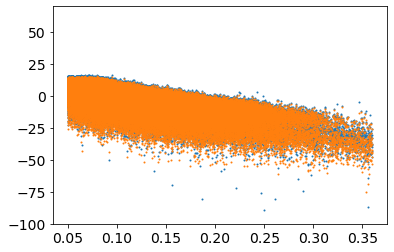

In [33]:
plt.scatter(df_train['z'],df_train['logp'],s=1)
plt.scatter(df_train['z'],df_train['logp_marg'],s=1)
plt.ylim(-100,70)

In [35]:

df_test         = pd.DataFrame.from_dict(dict((k,test[k]) for k in ('MJD','fiber','plate','new_label','RA', 'DE','logp_marg') if k in test))
df_test['logp'] = dens_test
df_test['mask_fracs'] = np.sum(~test['mask'].astype('bool'),axis=1)/1000
df_test['z']    = test['z']
noise            = np.ma.array(np.squeeze(test['noise']),mask=~np.squeeze(test['mask'].astype('bool')))
# reconsq          = np.ma.array((np.squeeze(test['spec'])-decoded['test'])**2,mask=~np.squeeze(test['mask'].astype('bool')))
# mean_recon_error = np.ma.mean(reconsq,axis=0)
# noise            = noise#+1./mean_recon_error
df_test['recon_error_std'] = np.ma.std(np.ma.array(np.squeeze(test['spec'])-decoded['test'],mask=~np.squeeze(test['mask'].astype('bool')))**2*noise,axis=1)

df_test['recon_error'] = np.ma.mean(np.ma.clip(np.ma.array(np.squeeze(test['spec'])-decoded['test'],\
mask=~np.squeeze(test['mask'].astype('bool')))**2*noise,a_min=np.zeros_like(df_test['recon_error_std'].to_numpy())[:,None],a_max=clip*df_test['recon_error_std'].to_numpy()[:,None]),axis=1)

df_test['max_recon_error'] = np.ma.max(np.ma.array(np.squeeze(test['spec'])-decoded['test'],mask=~np.squeeze(test['mask'].astype('bool')))**2*noise,axis=1)
#df_test = df_test[df_test['z']>0.1]
df_test = df_test.reset_index()

Text(0.5, 0, 'redshift')

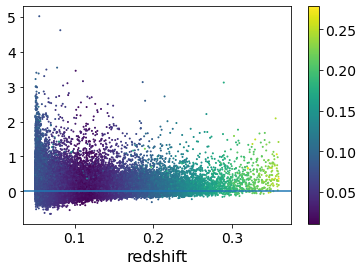

In [36]:
plt.scatter(df_test['z'],np.log(df_test['recon_error']), s=1, c=df_test['mask_fracs'])
#plt.scatter(df_test['z'][df_test['supernova']==1],np.log(df_test['recon_error'])[df_test['supernova']==1], s=3, color='red')
plt.colorbar()
plt.axhline(0)
plt.xlabel('redshift')

In [37]:
df_valid         = pd.DataFrame.from_dict(dict((k,valid[k]) for k in ('MJD','fiber','plate','new_label','RA', 'DE', 'logp_marg') if k in valid))
df_valid['logp'] = dens_valid
df_valid['mask_fracs'] = np.sum(~valid['mask'].astype('bool'),axis=1)/1000
df_valid['z']    = valid['z']
noise            = np.ma.array(np.squeeze(valid['noise']),mask=~np.squeeze(valid['mask'].astype('bool')))
# reconsq          = np.ma.array((np.squeeze(valid['spec'])-decoded['valid'])**2,mask=~np.squeeze(valid['mask'].astype('bool')))
# mean_recon_error = np.ma.mean(reconsq,axis=0)
# noise            = noise+1./mean_recon_error

df_valid['recon_error_std'] = np.ma.std(np.ma.array(np.squeeze(valid['spec'])-decoded['valid'],mask=~np.squeeze(valid['mask'].astype('bool')))**2*noise,axis=1)

df_valid['recon_error'] = np.ma.mean(np.ma.clip(np.ma.array(np.squeeze(valid['spec'])-decoded['valid'],\
mask=~np.squeeze(valid['mask'].astype('bool')))**2*noise,a_min=np.zeros_like(df_valid['recon_error_std'].to_numpy())[:,None],a_max=clip*df_valid['recon_error_std'].to_numpy()[:,None]),axis=1)

df_valid['max_recon_error'] = np.ma.max(np.ma.array(np.squeeze(valid['spec'])-decoded['valid'],mask=~np.squeeze(valid['mask'].astype('bool')))**2*noise,axis=1)
#df_valid = df_valid[df_valid['z']>0.1]
df_valid = df_valid.reset_index()

In [38]:
for df in [df_train, df_valid, df_test]:
    sns = df.merge(Supernovas, on=['MJD','plate','fiber'])
    df['supernova']=np.zeros(len(df['MJD']))
    df.loc[sns['index'],'supernova']=1

In [39]:
df_valid[df_valid['supernova']==1]

,index,MJD,fiber,plate,new_label,RA,logp_marg,logp,mask_fracs,z,recon_error_std,recon_error,max_recon_error,supernova
11444,11444,51883,171,271,0,154.501968,1.237987,2.072065,0.059,0.065088,10.525976,7.044625,65.357368,1.0
55237,55237,51981,379,549,0,128.041046,-5.844144,-5.108952,0.031,0.133955,2.056344,1.307110,13.944591,1.0
63126,63126,51818,181,358,0,263.118927,-14.613077,-18.419926,0.021,0.122440,4.971669,2.628851,45.109434,1.0


In [40]:
df_test[df_test['supernova']==1]

,index,MJD,fiber,plate,new_label,RA,logp_marg,logp,mask_fracs,z,recon_error_std,recon_error,max_recon_error,supernova
7249,7249,51633,572,268,6,149.815643,0.707182,1.777147,0.044,0.088002,2.184036,1.194952,24.508435,1.0
11580,11580,52079,209,604,1,204.936554,-8.211179,-5.878920,0.033,0.135729,3.339456,1.912473,30.981755,1.0
23135,23135,51955,247,472,0,137.909927,-22.167682,-24.684525,0.060,0.070203,23.277411,12.539278,223.535964,1.0


In [41]:
df_train[df_train['supernova']==1]

,index,MJD,fiber,plate,new_label,RA,logp_marg,logp,mask_fracs,z,recon_error_std,recon_error,max_recon_error,supernova
76242,76242,51908,559,454,0,37.265533,-3.415664,-2.586495,0.037,0.140660,1.911274,0.875269,15.076705,1.0
82911,82911,51911,319,452,6,140.621445,-1.840989,-1.349676,0.069,0.062510,6.184489,2.672830,53.767648,1.0
89190,89190,52017,2,543,0,119.193733,-1.025597,-0.363171,0.051,0.077939,3.124277,1.326070,30.874477,1.0
131838,131838,51884,462,438,7,120.802551,-14.223358,-10.437283,0.027,0.117353,11.032963,3.426798,149.336425,1.0
139780,139780,51984,102,498,0,212.742996,-9.359131,-8.542568,0.039,0.140476,3.134763,1.301919,25.019495,1.0
186142,186142,51613,575,305,0,217.558609,-18.783047,-18.815680,0.035,0.096186,7.846162,3.615960,58.498052,1.0
193965,193965,51928,76,291,0,191.889206,-3.848614,-3.014822,0.038,0.086368,5.086950,2.189709,41.621983,1.0


In [42]:
import sklearn.linear_model
import sklearn.kernel_ridge


In [43]:
def fit_regression(data_,p, name, var):
    LRl.fit((data_[var]**p)[:,None],data_[name][:,None])
    pred = LRl.predict((data_[var]**p)[:,None])
    print('uncorrected')
    plt.figure()
    h =plt.hist2d(data_[var], data_[name], range=[[0.0,0.4],[-50,50]], bins=[40,40])
    plt.plot(data_[var],pred, ls='',marker='.')
    plt.show()
    return data_[name][:,None]-pred, LRl

0
uncorrected


/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until


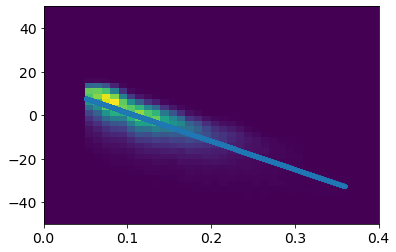

(209462, 1)
corrected 0


/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


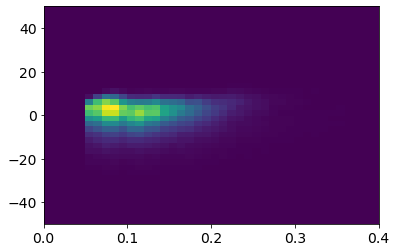

1
(69820, 1)
corrected 1


/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  # This is added back by InteractiveShellApp.init_path()


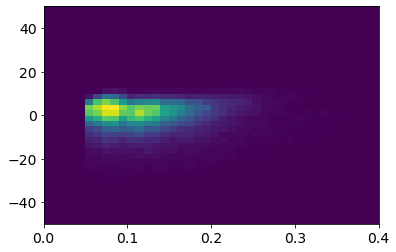

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  # This is added back by InteractiveShellApp.init_path()


2
(69822, 1)
corrected 2


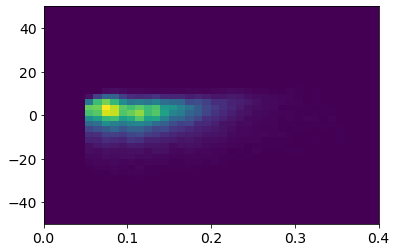

0
uncorrected


/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  
/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  This is separate from the ipykernel package so we can avoid doing imports until


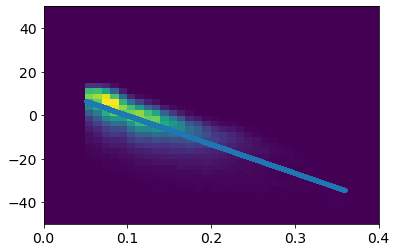

(209462, 1)
corrected 0


/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  if __name__ == '__main__':


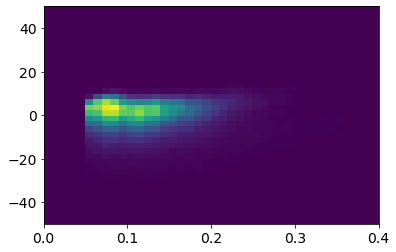

1
(69820, 1)
corrected 1


/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  # This is added back by InteractiveShellApp.init_path()


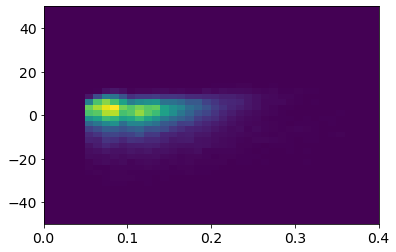

/global/homes/v/vboehm/.conda/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  # This is added back by InteractiveShellApp.init_path()


2
(69822, 1)
corrected 2


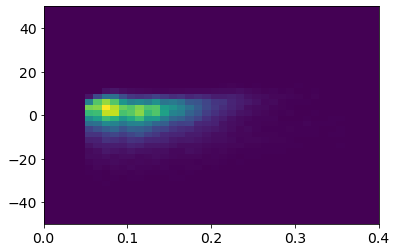

In [44]:
# for ii in range(16):
var = 'z'
for name in ['logp','logp_marg']:
    LRl = sklearn.linear_model.LinearRegression()
    p=1
    for jj, df_ in enumerate([df_train, df_valid, df_test]):
        print(jj)
        if jj ==0:
            val, LRl = fit_regression(df_, p, name, var)
        else:
            val = df_[name][:,None]-LRl.predict((df_[var]**p)[:,None])
        df_.loc[:,name+'_corr'] = val[:,0]
        print(val.shape)
        print('corrected', jj)
        plt.figure()
        h =plt.hist2d(df_[var], df_[name+'_corr'], range=[[0.0,0.4],[-50,50]], bins=[40,40])
        plt.show()

In [45]:
# # for ii in range(16):
# var = 'mask_fracs'
# for name in ['logp_corr','logp_marg_corr']:
#     LRl = sklearn.linear_model.LinearRegression()
#     p=1
#     for jj, df_ in enumerate([df_train, df_valid, df_test]):
#         print(jj)
#         if jj ==0:
#             val, LRl = fit_regression(df_, p, name, var)
#         else:
#             val = df_[name][:,None]-LRl.predict((df_[var]**p)[:,None])
#         df_.loc[:,name+'_corr'] = val[:,0]
#         print(val.shape)
#         print('corrected', jj)
#         plt.figure()
#         h =plt.hist2d(df_[var], df_[name+'_corr'], range=[[0.0,0.4],[-50,50]], bins=[40,40])
#         plt.show()

In [46]:
corr, _= scipy.stats.pearsonr(df_valid['mask_fracs'],-df_valid['logp'])
print(corr)
corr, _= scipy.stats.pearsonr(df_valid['mask_fracs'],df_valid['logp_corr'])
print(corr)
corr, _= scipy.stats.pearsonr(df_valid['mask_fracs'],df_valid['z'])
print(corr)
corr, _= scipy.stats.pearsonr(-df_valid['logp'],df_valid['z'])
print(corr)
corr, _= scipy.stats.pearsonr(-df_valid['logp_corr'],df_valid['z'])
print(corr)

corr, _= scipy.stats.pearsonr(-df_valid['logp_marg'],df_valid['z'])
print(corr)
corr, _= scipy.stats.pearsonr(-df_valid['logp_marg_corr'],df_valid['z'])
print(corr)

0.36797622500907434
0.017934591649891363
0.5615153815425469
0.6953180312944668
0.023688071966105968
0.7130598114042614
0.010525877045215966


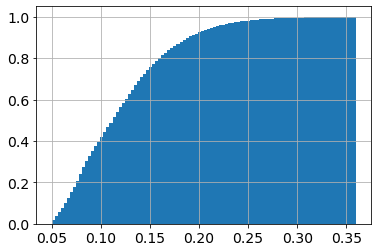

In [47]:
_ = plt.hist(df_train['z'],bins=100, cumulative=True, density=True)
plt.grid()

Text(0.5, 0, 'mask_fracs')

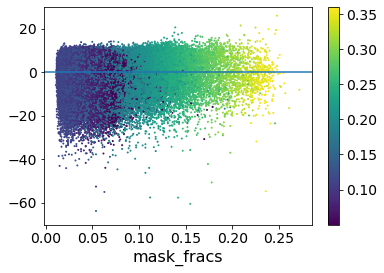

In [48]:
plt.scatter(df_train['mask_fracs'],df_train['logp_corr'], s=1, c=df_train['z'])
plt.colorbar()
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('mask_fracs')

Text(0.5, 0, 'mask_fracs')

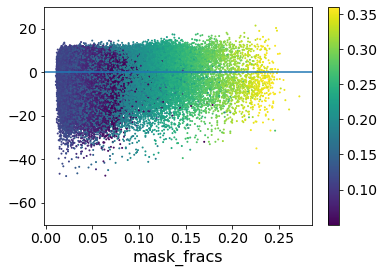

In [49]:
plt.scatter(df_train['mask_fracs'],df_train['logp_marg_corr'], s=1, c=df_train['z'])
plt.colorbar()
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('mask_fracs')

Text(0.5, 0, 'redshift')

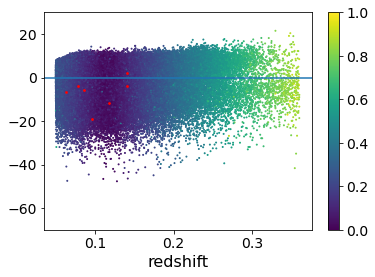

In [50]:
plt.scatter(df_train['z'],df_train['logp_marg_corr'], s=1, c=df_train['mask_fracs'])
plt.scatter(df_train['z'][df_train['supernova']==1],df_train['logp_marg_corr'][df_train['supernova']==1], s=3, color='red')

plt.colorbar()
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('redshift')

Text(0.5, 0, 'redshift')

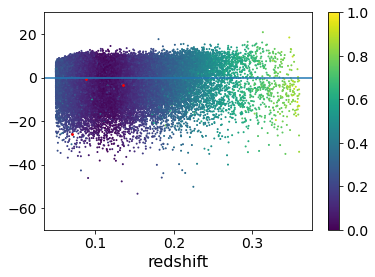

In [51]:
plt.scatter(df_test['z'],df_test['logp_marg_corr'], s=1, c=df_test['mask_fracs'])
plt.scatter(df_test['z'][df_test['supernova']==1],df_test['logp_marg_corr'][df_test['supernova']==1], s=3, color='red')
plt.colorbar()
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('redshift')

Text(0.5, 0, 'mask_fracs')

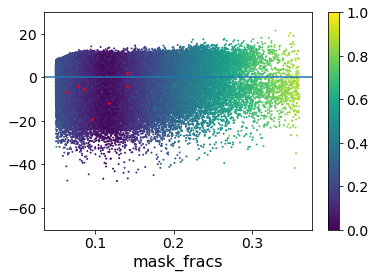

In [52]:
plt.scatter(df_train['z'],df_train['logp_marg_corr'], s=1, c=df_train['mask_fracs'])
plt.scatter(df_train['z'][df_train['supernova']==1],df_train['logp_marg_corr'][df_train['supernova']==1], s=3, color='red')

plt.colorbar()
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('mask_fracs')

In [53]:
import scipy
from scipy.spatial import KDTree



In [54]:
df_train[df_train['supernova']==1]

,index,MJD,fiber,plate,new_label,RA,logp_marg,logp,mask_fracs,z,recon_error_std,recon_error,max_recon_error,supernova,logp_corr,logp_marg_corr
76242,76242,51908,559,454,0,37.265533,-3.415664,-2.586495,0.037,0.140660,1.911274,0.875269,15.076705,1.0,1.538726,2.081861
82911,82911,51911,319,452,6,140.621445,-1.840989,-1.349676,0.069,0.062510,6.184489,2.672830,53.767648,1.0,-7.425068,-6.698430
89190,89190,52017,2,543,0,119.193733,-1.025597,-0.363171,0.051,0.077939,3.124277,1.326070,30.874477,1.0,-4.424628,-3.838630
131838,131838,51884,462,438,7,120.802551,-14.223358,-10.437283,0.027,0.117353,11.032963,3.426798,149.336425,1.0,-9.354220,-11.814026
139780,139780,51984,102,498,0,212.742996,-9.359131,-8.542568,0.039,0.140476,3.134763,1.301919,25.019495,1.0,-4.441359,-3.885983
186142,186142,51613,575,305,0,217.558609,-18.783047,-18.815680,0.035,0.096186,7.846162,3.615960,58.498052,1.0,-20.495447,-19.178351
193965,193965,51928,76,291,0,191.889206,-3.848614,-3.014822,0.038,0.086368,5.086950,2.189709,41.621983,1.0,-5.976124,-5.544844


(7, 4)


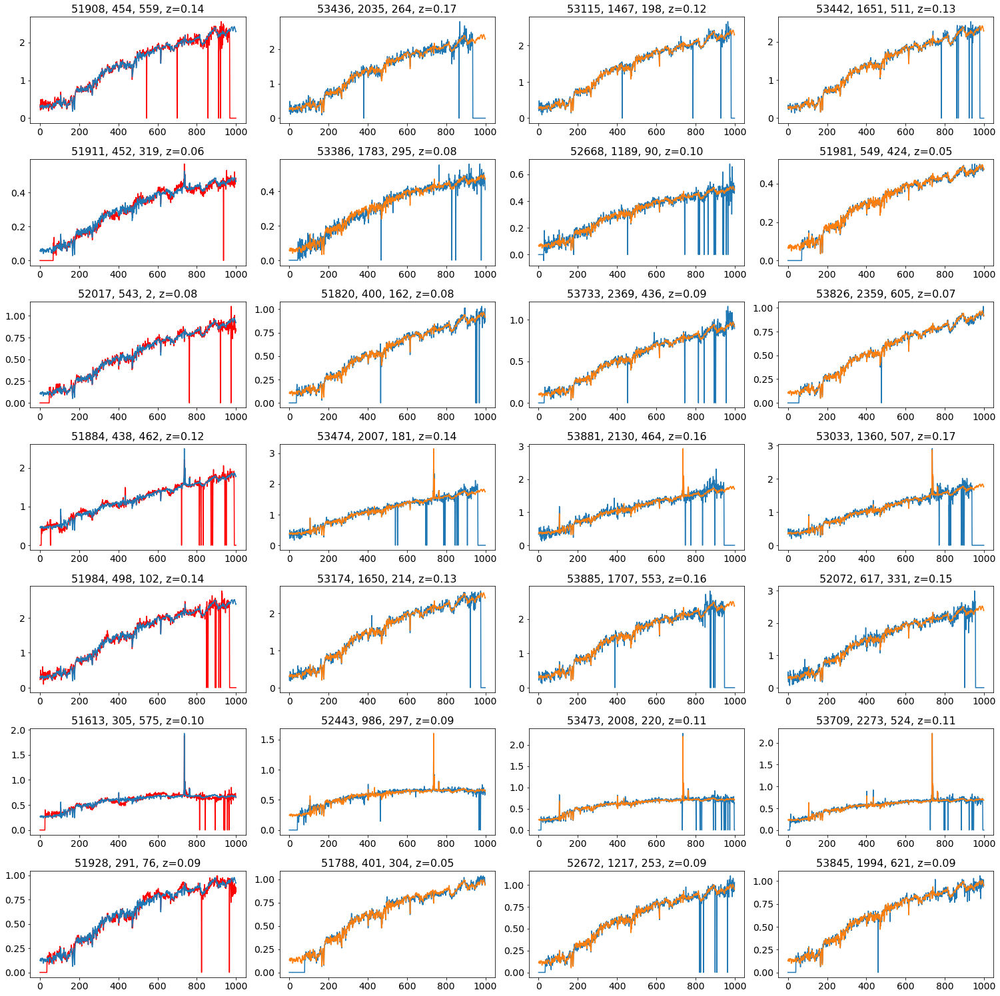

In [55]:
tree = KDTree(encoded_valid, leafsize=10)
_, i = tree.query(encoded_train[df_train['supernova']==1], k=3, eps=0, p=1)

fig, ax = plt.subplots(7,4,figsize=(21,21))
print(ax.shape)
nn=0
for ii in range(7):
    for jj in range(4):
        if jj==0:
            ind = (df_train.index[df_train['supernova']==1])[nn]
            ax[ii][0].set_title('%d, %d, %d, z=%.2f'%(df_train['MJD'][ind],df_train['plate'][ind],df_train['fiber'][ind],df_train['z'][ind]))
            ax[ii][0].plot(train['spec'][ind],color='red')
            ax[ii][0].plot(decoded['train'][ind])
            nn+=1
        else:
            ind = i[ii,jj-1]
            ax[ii][jj].set_title('%d, %d, %d, z=%.2f'%(df_valid['MJD'][ind],df_valid['plate'][ind],df_valid['fiber'][ind],df_valid['z'][ind]))
            ax[ii][jj].plot(valid['spec'][ind])
            ax[ii][jj].plot(decoded['valid'][ind])
plt.tight_layout()

(3, 4)


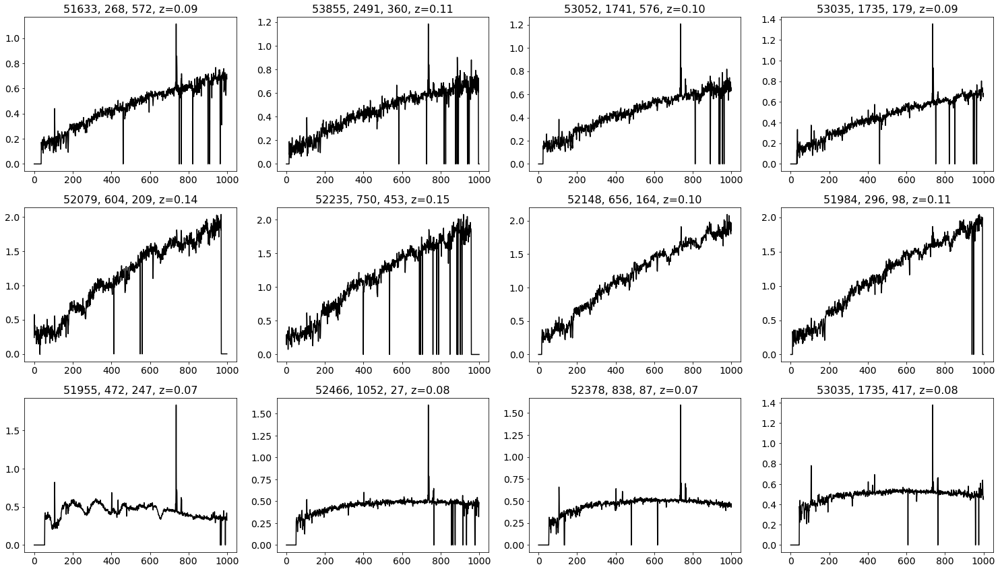

In [57]:
tree = KDTree(encoded_train, leafsize=10)
_, i = tree.query(encoded_test[df_test['supernova']==1], k=3, eps=0, p=1)

fig, ax = plt.subplots(3,4,figsize=(21,12))
print(ax.shape)
nn=0
for ii in range(3):
    for jj in range(4):
        if jj==0:
            ind = (df_test.index[df_test['supernova']==1])[nn]
            ax[ii][jj].set_title('%d, %d, %d, z=%.2f'%(df_test['MJD'][ind],df_test['plate'][ind],df_test['fiber'][ind],df_test['z'][ind]))
            ax[ii][jj].plot(test['spec'][ind],color='black')
            #ax[ii][jj].plot(decoded['test'][ind],color='red')
            

            nn+=1
        else:
            ind = i[ii,jj-1]
            ax[ii][jj].set_title('%d, %d, %d, z=%.2f'%(df_train['MJD'][ind],df_train['plate'][ind],df_train['fiber'][ind],df_train['z'][ind]))
            ax[ii][jj].plot(train['spec'][ind],color='black')
            #ax[ii][jj].plot(decoded['train'][ind])
plt.tight_layout()

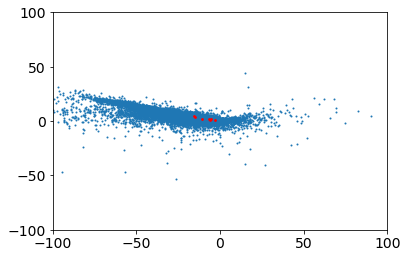

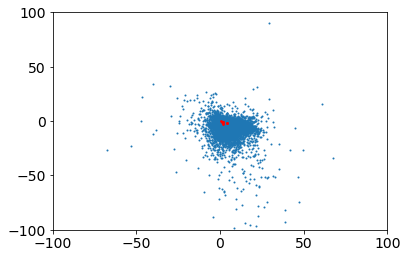

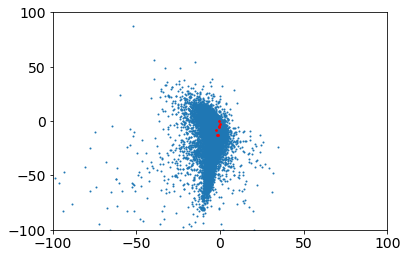

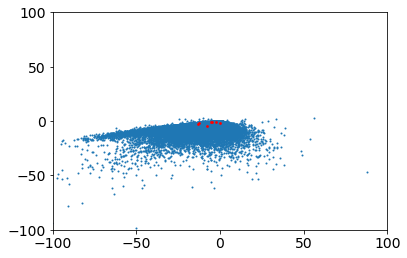

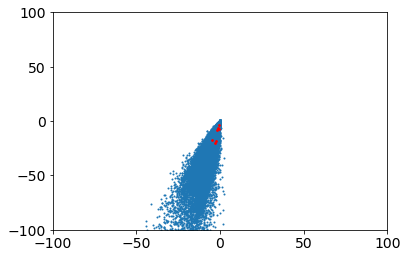

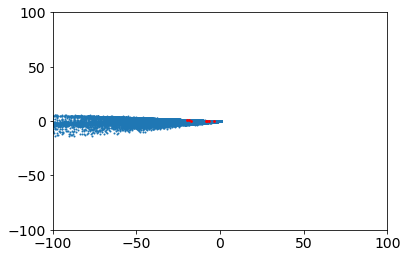

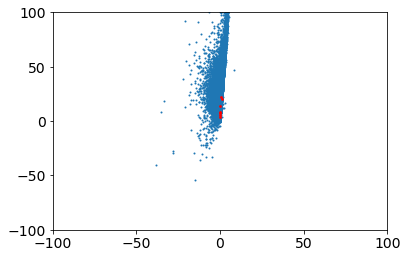

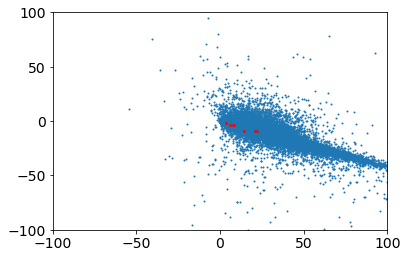

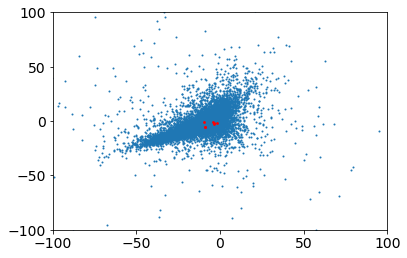

In [58]:
for ii in range(9):
    plt.scatter(encoded_train[:,ii],encoded_train[:,ii+1], s=1)
    plt.scatter(encoded_train[:,ii][df_train['supernova']==1],encoded_train[:,ii+1][df_train['supernova']==1], color='red',s=3)
    plt.xlim(-100,100)
    plt.ylim(-100,100)
    plt.show()

Text(0.5, 0, 'mask_fracs')

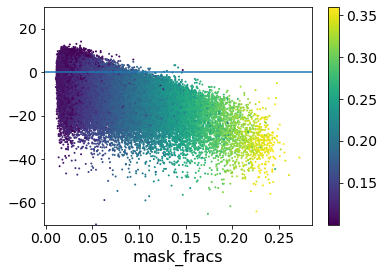

In [59]:
plt.scatter(df_train['mask_fracs'][df_train['z']>0.1],df_train['logp'][df_train['z']>0.1], s=1, c=df_train['z'][df_train['z']>0.1])
plt.colorbar()
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('mask_fracs')

Text(0.5, 0, 'logp')

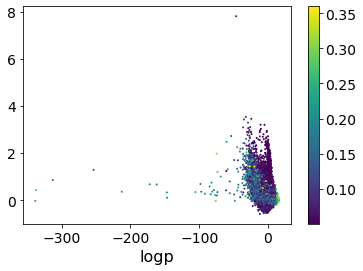

In [60]:
plt.scatter(df_valid['logp_corr'],np.log(df_valid['recon_error']), s=1, c=df_valid['z'])
plt.colorbar()
plt.xlabel('logp')

Text(0.5, 0, 'logp')

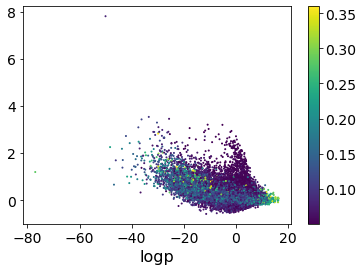

In [61]:
plt.scatter(df_valid['logp_marg_corr'],np.log(df_valid['recon_error']), s=1, c=df_valid['z'])
plt.colorbar()
plt.xlabel('logp')

In [62]:
for df in [df_test, df_train, df_valid]:
    df.drop(columns=['logp'],inplace=True)
    print(df.keys())
    df.rename(columns={'logp_corr':'logp'},inplace=True)

Index(['index', 'MJD', 'fiber', 'plate', 'new_label', 'RA', 'logp_marg',
       'mask_fracs', 'z', 'recon_error_std', 'recon_error', 'max_recon_error',
       'supernova', 'logp_corr', 'logp_marg_corr'],
      dtype='object')
Index(['index', 'MJD', 'fiber', 'plate', 'new_label', 'RA', 'logp_marg',
       'mask_fracs', 'z', 'recon_error_std', 'recon_error', 'max_recon_error',
       'supernova', 'logp_corr', 'logp_marg_corr'],
      dtype='object')
Index(['index', 'MJD', 'fiber', 'plate', 'new_label', 'RA', 'logp_marg',
       'mask_fracs', 'z', 'recon_error_std', 'recon_error', 'max_recon_error',
       'supernova', 'logp_corr', 'logp_marg_corr'],
      dtype='object')


Text(0.5, 0, 'mask_fracs')

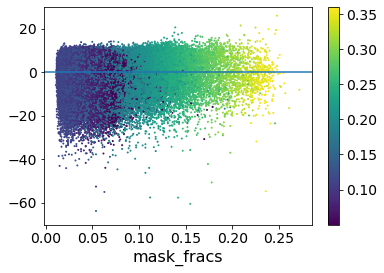

In [63]:
plt.scatter(df_train['mask_fracs'],df_train['logp'], s=1, c=df_train['z'])
plt.colorbar()
plt.axhline(0)
plt.ylim(-70,30)
plt.xlabel('mask_fracs')

(-70.0, 30.0)

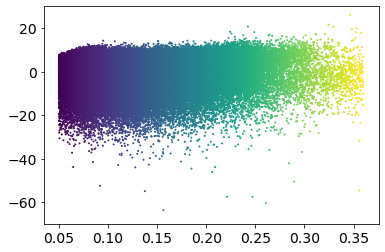

In [64]:
plt.scatter(df_train['z'],df_train['logp'], s=1, c=df_train['z'])
plt.ylim(-70,30)

(-400.0, 30.0)

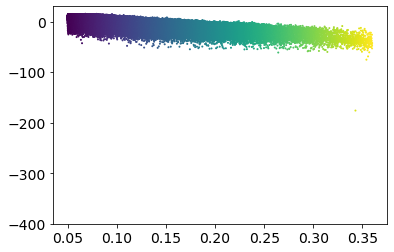

In [65]:
plt.scatter(train['z'],train['logp_marg'], s=1, c=train['z'])
plt.ylim(-400,30)

In [4]:
import pandas as pd

In [5]:
df_test = pd.read_csv(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/results/','test_set.csv'))


In [7]:
df_test.columns

Index(['Unnamed: 0', 'index', 'MJD', 'fiber', 'plate', 'new_label', 'RA',
       'logp_marg', 'mask_fracs', 'z', 'recon_error_std', 'recon_error',
       'max_recon_error', 'supernova', 'logp', 'logp_marg_corr'],
      dtype='object')

In [68]:
df_train.to_csv(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/results/','training_set.csv'))
df_valid.to_csv(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/results/','validation_set.csv'))
df_test.to_csv(os.path.join('/global/cscratch1/sd/vboehm/SDSSOutlier/results/','test_set.csv'))

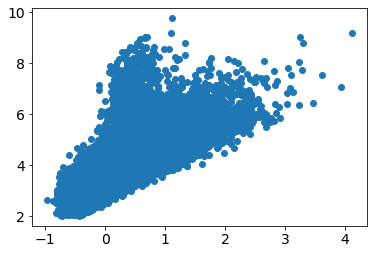

In [66]:
plt.scatter(np.log(df_train['recon_error']),np.log(df_train['max_recon_error']))

In [67]:
df_test[df_test['supernova']==1]

,index,MJD,fiber,plate,new_label,RA,logp_marg,mask_fracs,z,recon_error_std,recon_error,max_recon_error,supernova,logp,logp_marg_corr
7249,7249,51633,572,268,6,149.815643,0.707182,0.044,0.088002,2.184036,1.194952,24.508435,1.0,-0.970874,-0.772540
11580,11580,52079,209,604,1,204.936554,-8.211179,0.033,0.135729,3.339456,1.912473,30.981755,1.0,-2.397337,-3.367033
23135,23135,51955,247,472,0,137.909927,-22.167682,0.060,0.070203,23.277411,12.539278,223.535964,1.0,-29.755783,-26.005794


In [69]:
[le[x] for x in np.unique(df_test['new_label'])]

['GAL NO SUBCLASS NOT BROADLINE',
 'GAL NO SUBCLASS BROADLINE',
 'GAL AGN NOT BROADLINE',
 'GAL AGN BROADLINE',
 'GAL STARBURST NOT BROADLINE',
 'GAL STARBURST BROADLINE',
 'GAL STARFORMING NOT BROADLINE',
 'GAL STARFORMING BROADLINE',
 'QSO NO SUBCLASS NOT BROADLINE',
 'QSO NO SUBCLASS BROADLINE',
 'QSO AGN NOT BROADLINE',
 'QSO AGN BROADLINE',
 'QSO STARBURST NOT BROADLINE',
 'QSO STARBURST BROADLINE',
 'QSO STARFORMING NOT BROADLINE',
 'QSO STARFORMING BROADLINE']

In [70]:
np.where(np.unique(df_test['new_label'][:,],return_counts=True)[1])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),)

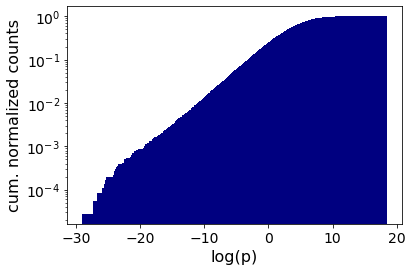

Anomalous Spectra test 0


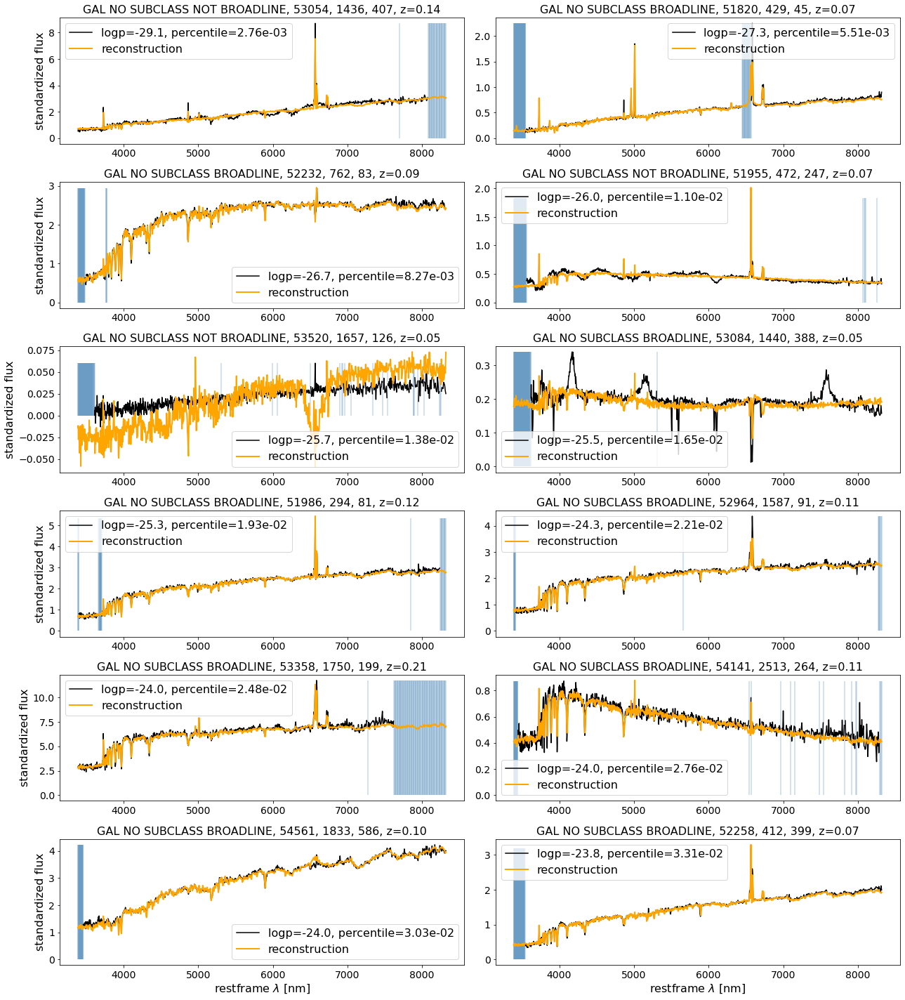

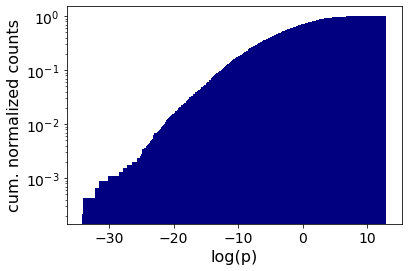

Anomalous Spectra test 2


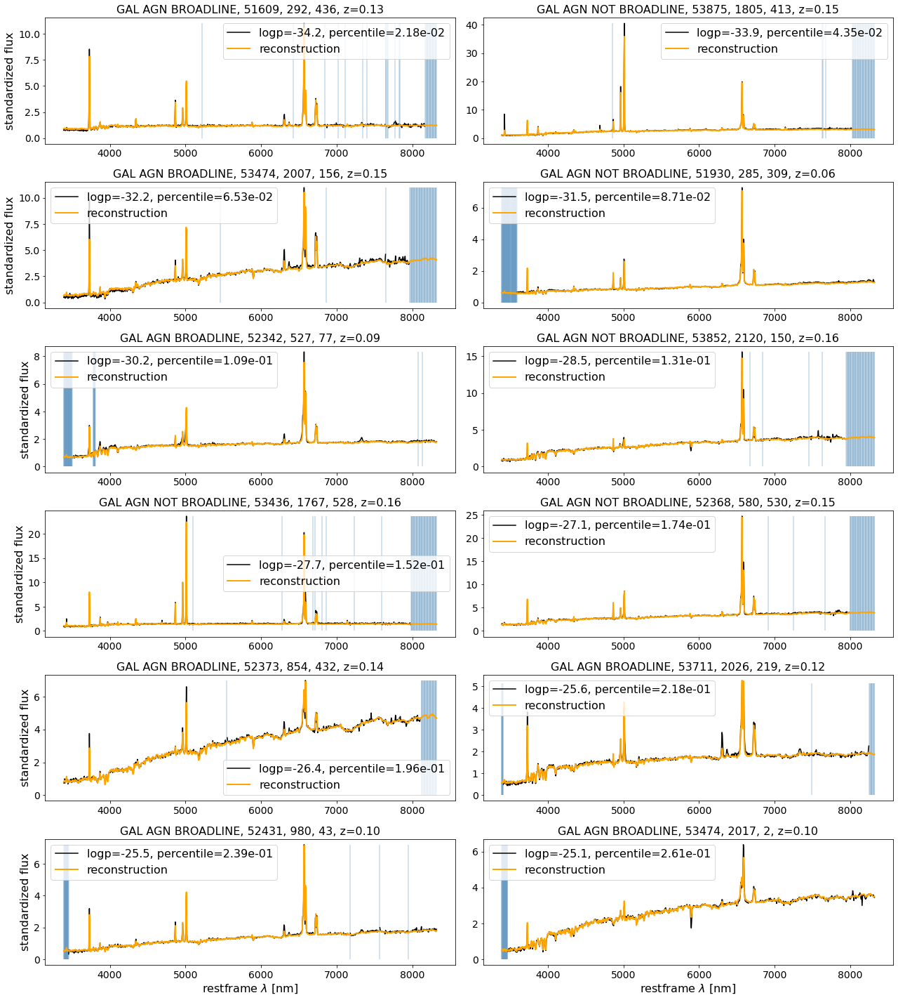

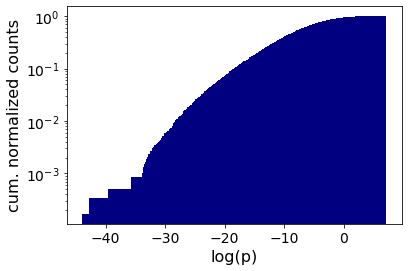

Anomalous Spectra test 4


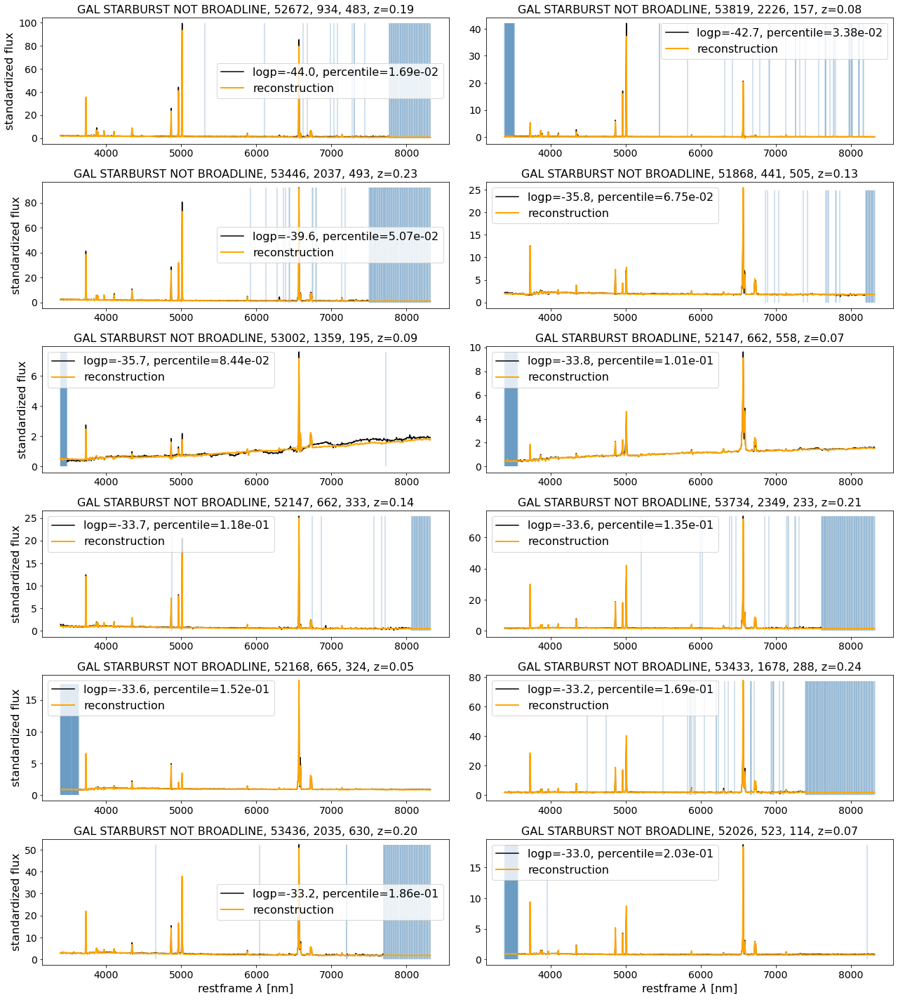

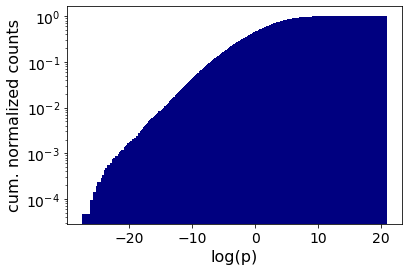

Anomalous Spectra test 6


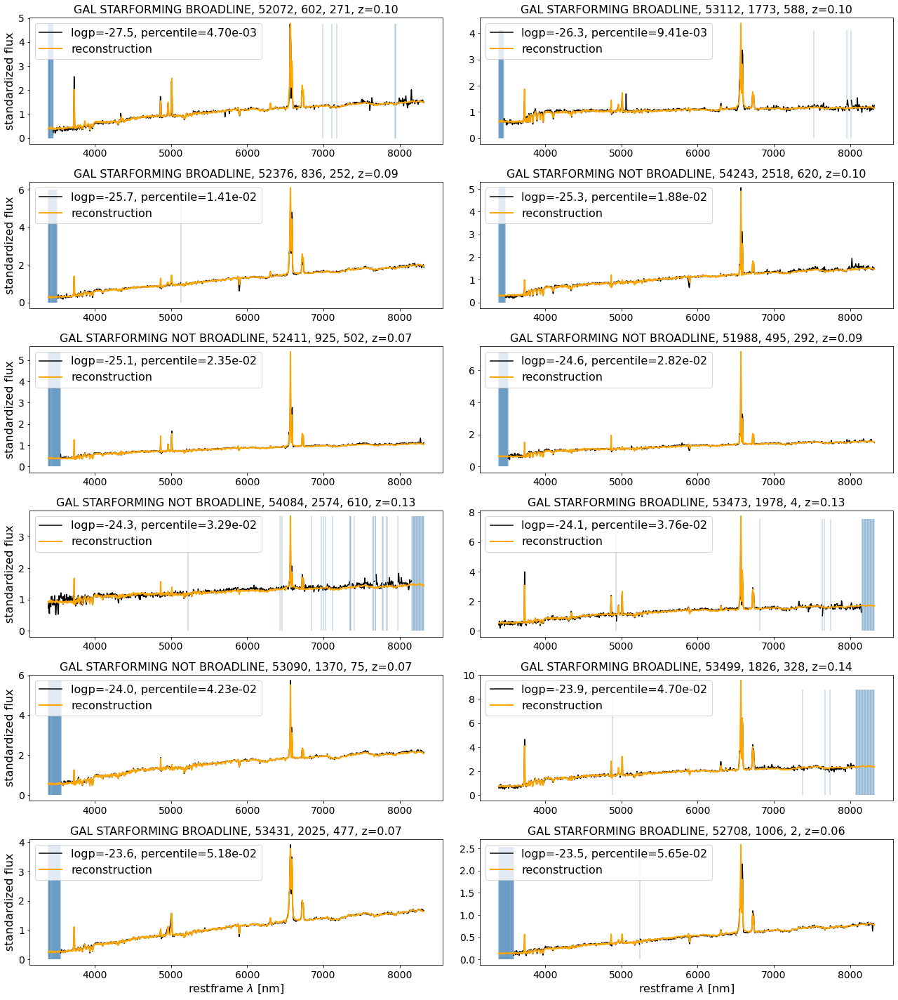

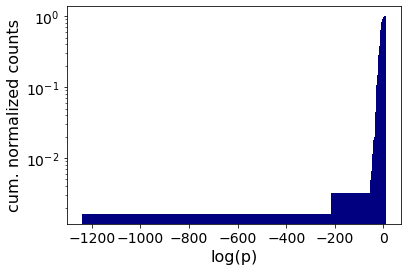

Anomalous Spectra test 8


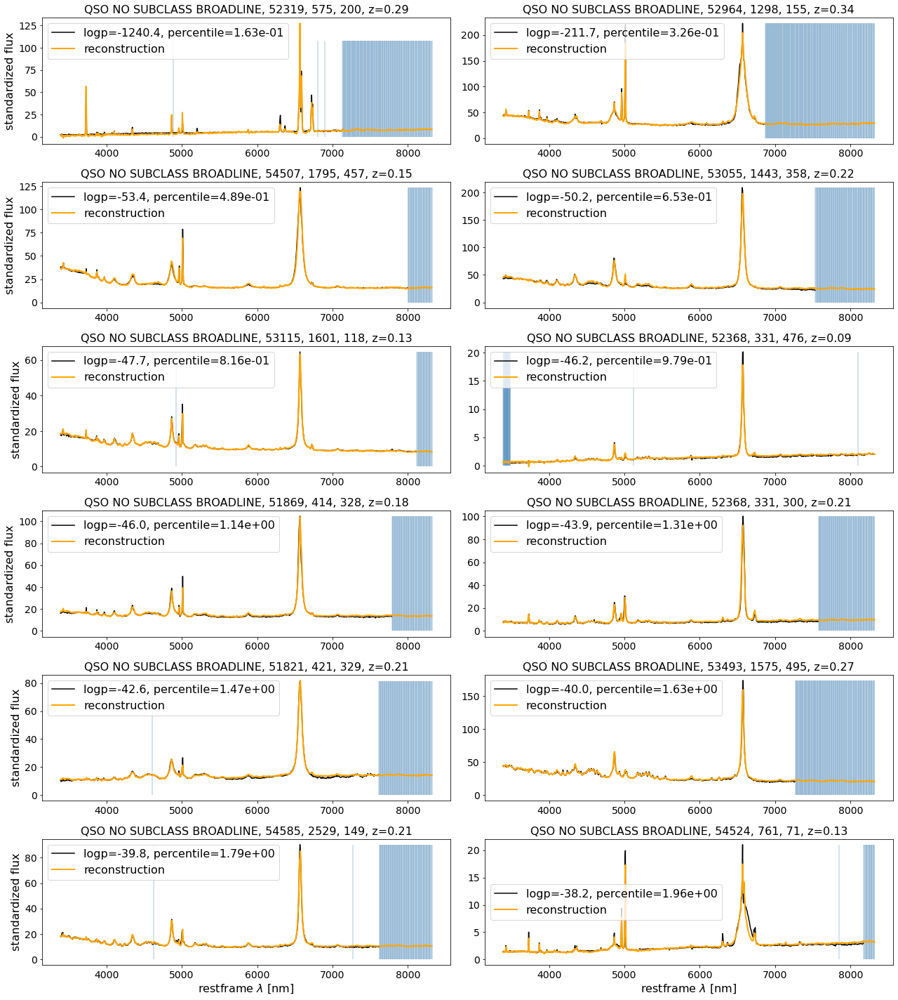

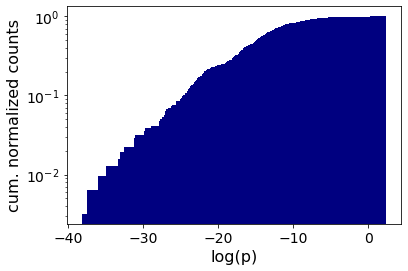

Anomalous Spectra test 10


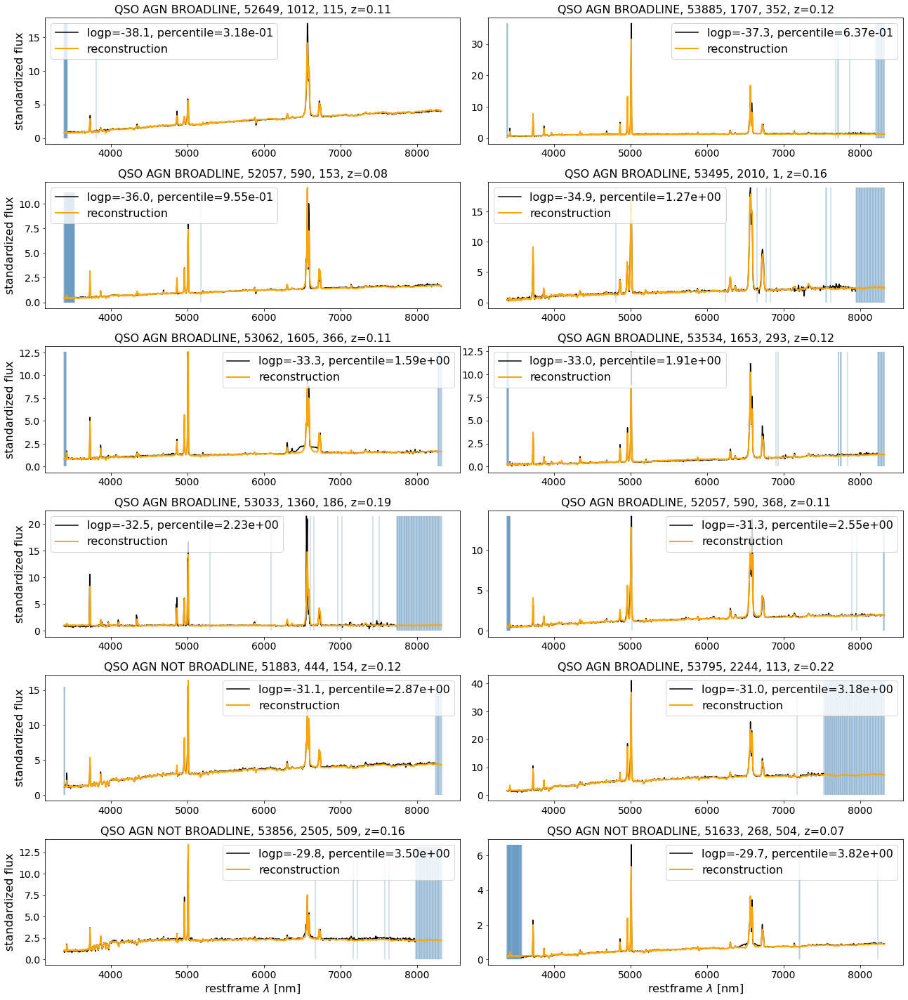

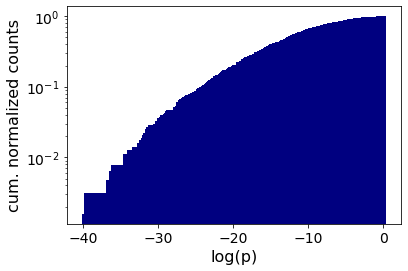

Anomalous Spectra test 12


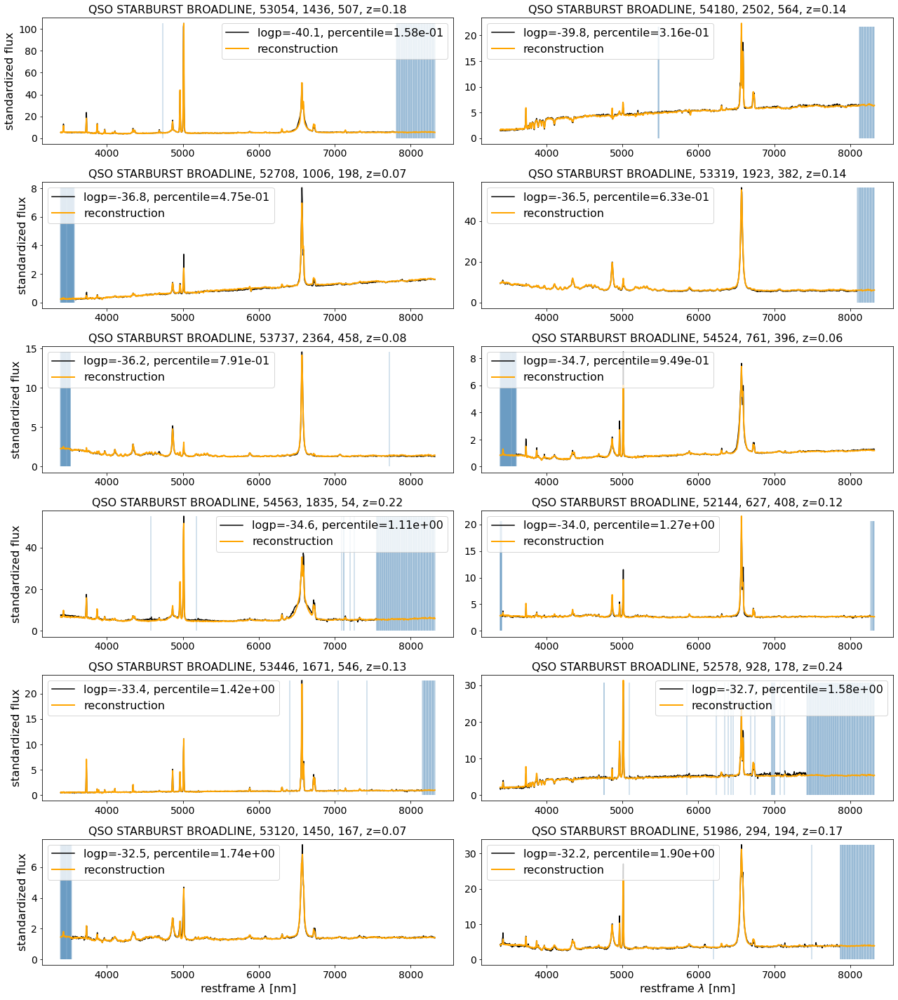

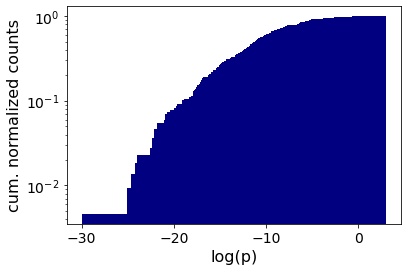

Anomalous Spectra test 14


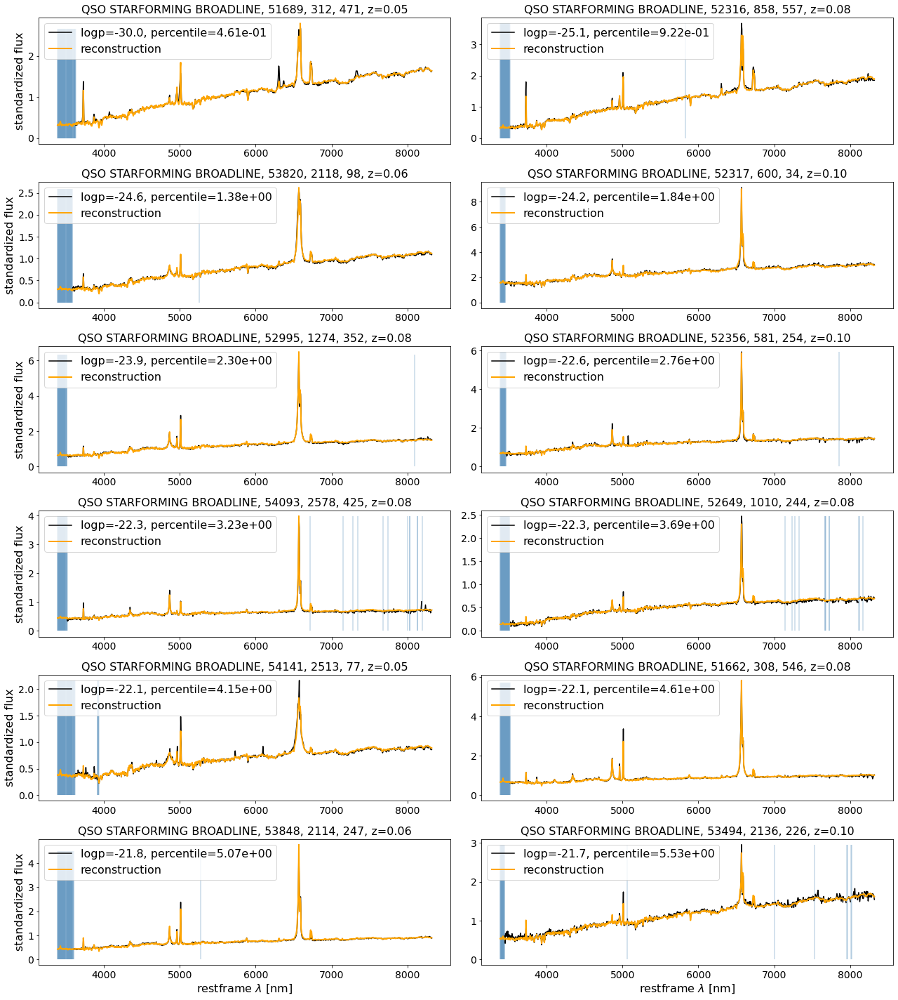

In [71]:
for mm in [0,  2,  4,  6,  8,  10,  12,  14]:
    for data, name, df in zip([test],['test'],[df_test]):
        ind               =np.where((df['new_label']==mm)|(df['new_label']==(mm+1)))[0]

        dens              = df['logp_marg_corr'].iloc[ind].to_numpy()

        ind_ood           = np.argsort(dens)
        dens_sorted       = dens[ind_ood]

        cum, bins, _      = plt.hist(dens_sorted,bins=500,density=True, cumulative=True, log=True, color='navy')
        plt.xlabel('log(p)')
        plt.ylabel('cum. normalized counts')
        plt.savefig(os.path.join(plotpath,'original/logp/','logp_hist_%s_bin%d.pdf'%(name,mm)), bbox_inches='tight')
        plt.show()
        plt.close()

        outliers_decoded  = decoded[name][ind][ind_ood]
        outliers_input    = masked[name][ind][ind_ood]

        wlmin, wlmax      = (3388,8318)
        fixed_num_bins    = 1000
        wl_range          = (np.log10(wlmin),np.log10(wlmax))
        new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

        print('Anomalous Spectra', name, mm)
        fi, ax = plt.subplots(6,2,figsize=(18,20))
        ax = ax.flatten()
        for ii in range(min(len(dens_sorted),12)):
            percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
            ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
            ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, percentile=%.2e'%(dens_sorted[ii],percentile), color='black')
            ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3)
            ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
            ax[ii].legend()
            if ii in [10,11]:
                ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
            if ii%2==0:
                ax[ii].set_ylabel(r'standardized flux')        
        plt.tight_layout()
        plt.savefig(os.path.join(plotpath,'original/logp/','logp_outliers_class_%s_class_%s.pdf'%(name,mm)), bbox_inches='tight')
        plt.show()
        plt.close()

        # print('Most normal Spectra', name, mm)
        # fi, ax = plt.subplots(6,2,figsize=(18,20),sharex=True)
        # ax = ax.flatten()
        # for nn, ii in enumerate(range(len(ind_ood)-min(12,len(dens_sorted)),len(ind_ood))):
        #     percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
        #     ax[nn].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
        #     ax[nn].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, percentile=%.2e'%(dens_sorted[ii],percentile), color='black')
        #     ax[nn].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=min(0,min(data['spec'][ind][ind_ood][ii])),ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3, label='mask')
        #     ax[nn].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        #     ax[nn].legend()
        #     if nn in [10,11]:
        #         ax[nn].set_xlabel(r'restframe $\lambda$ [nm]')
        #     if nn%2==0:
        #         ax[nn].set_ylabel(r'standardized flux')                
        # plt.tight_layout()
        # plt.savefig(os.path.join(plotpath,'original/logp/','logp_most_common_class_%s_%s.pdf'%(name,mm)), bbox_inches='tight')
        # plt.show()
        # plt.close()


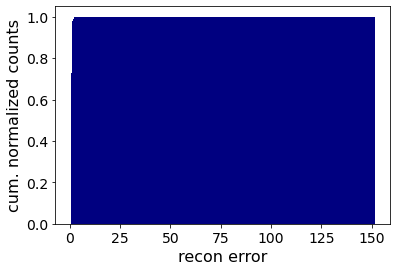

Anomalous Spectra test 0


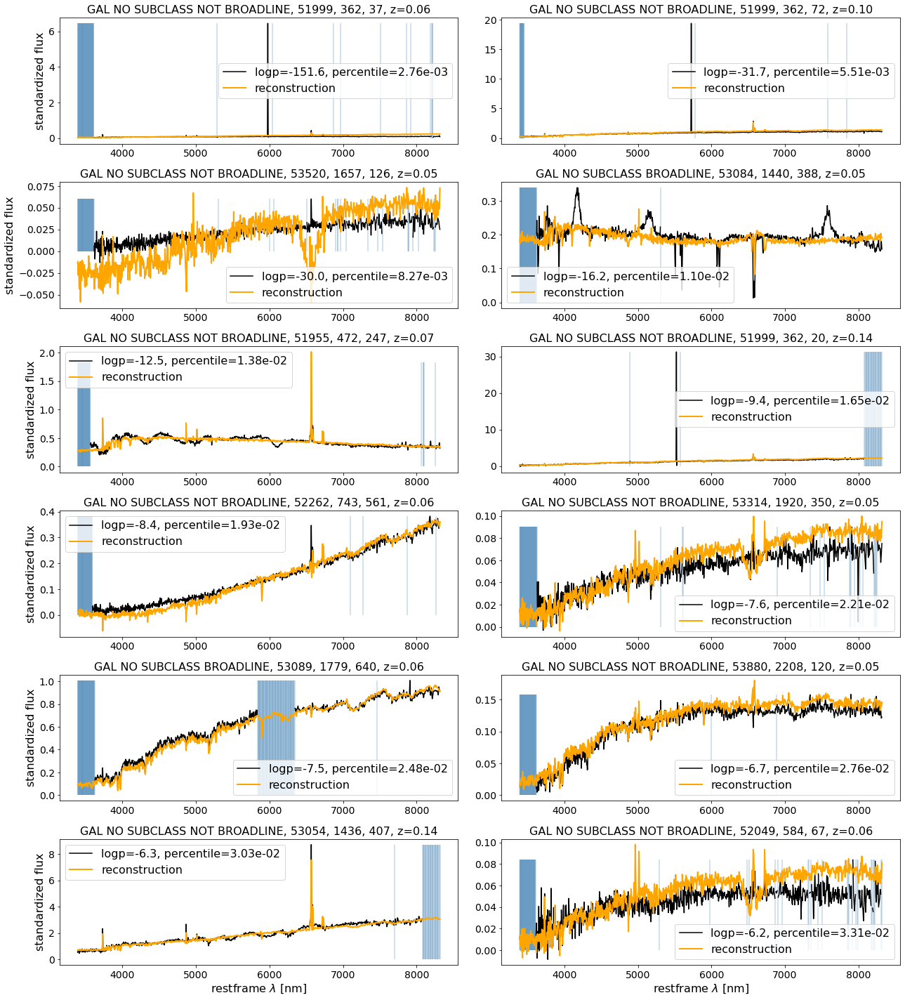

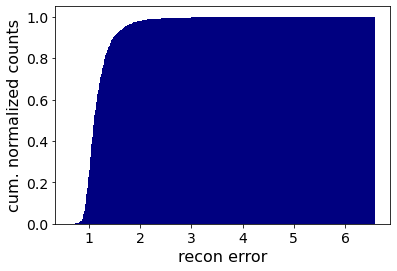

Anomalous Spectra test 2


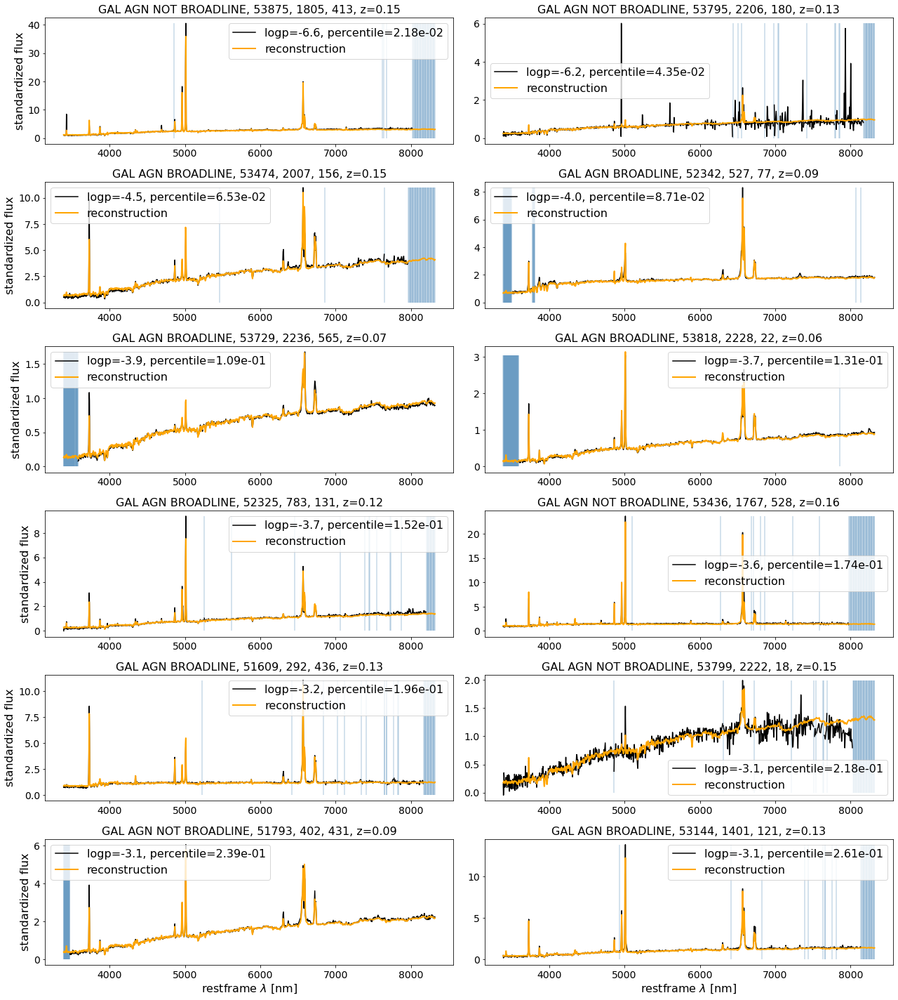

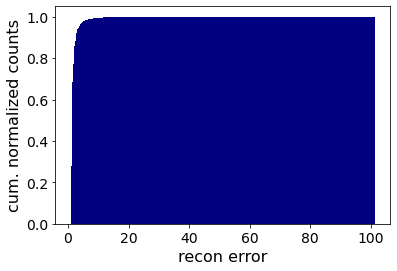

Anomalous Spectra test 4


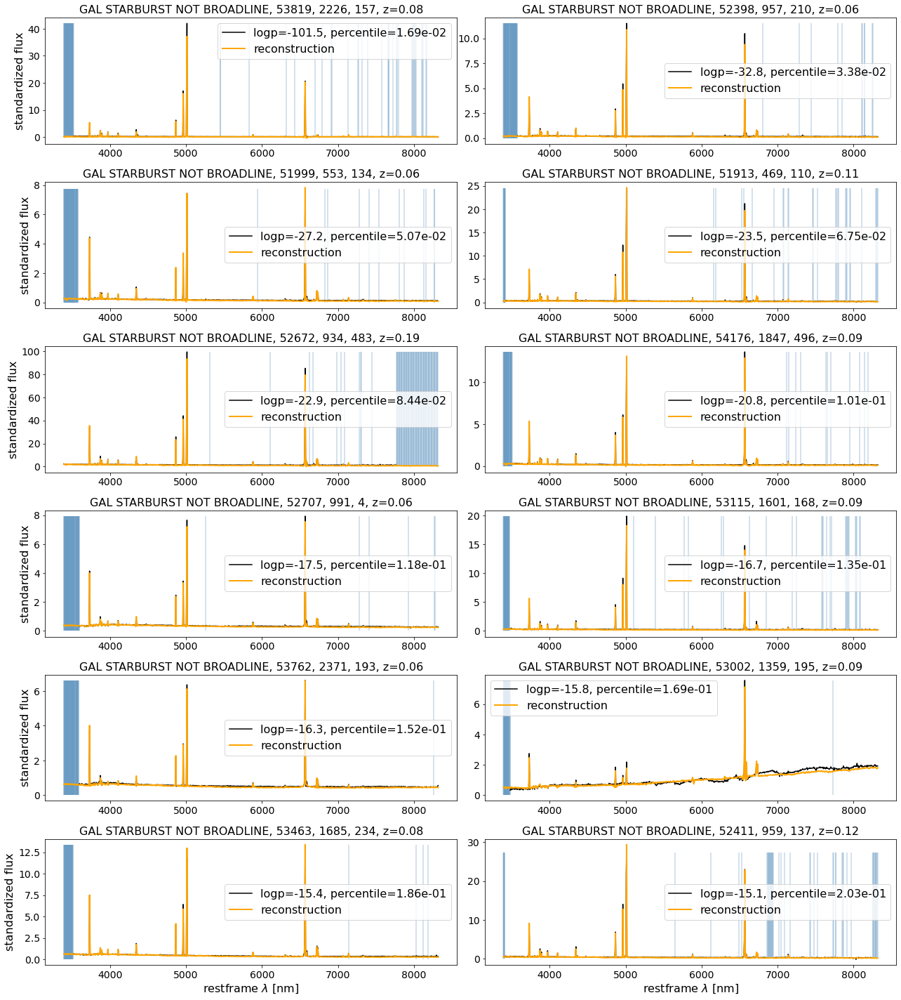

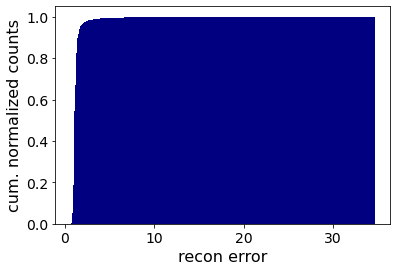

Anomalous Spectra test 6


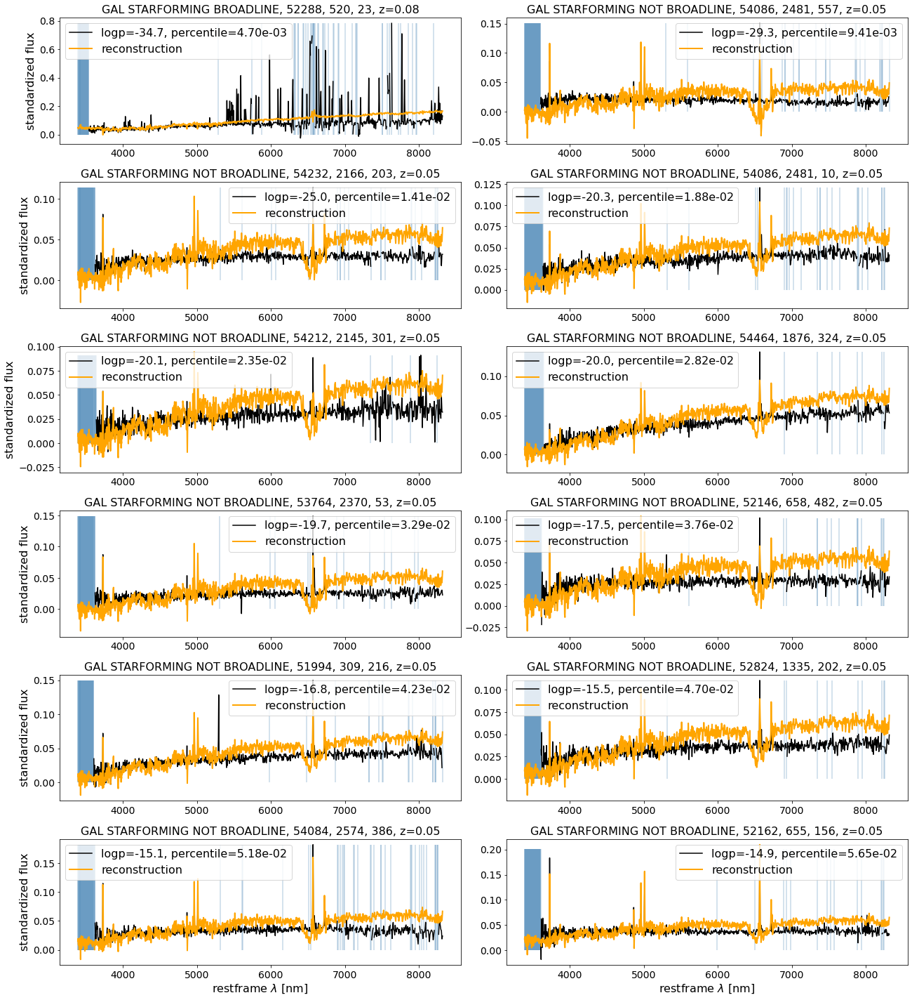

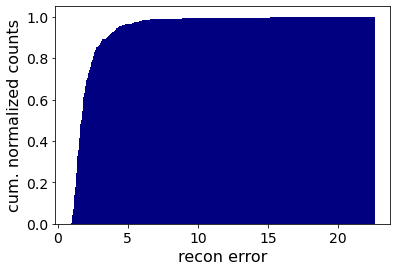

Anomalous Spectra test 8


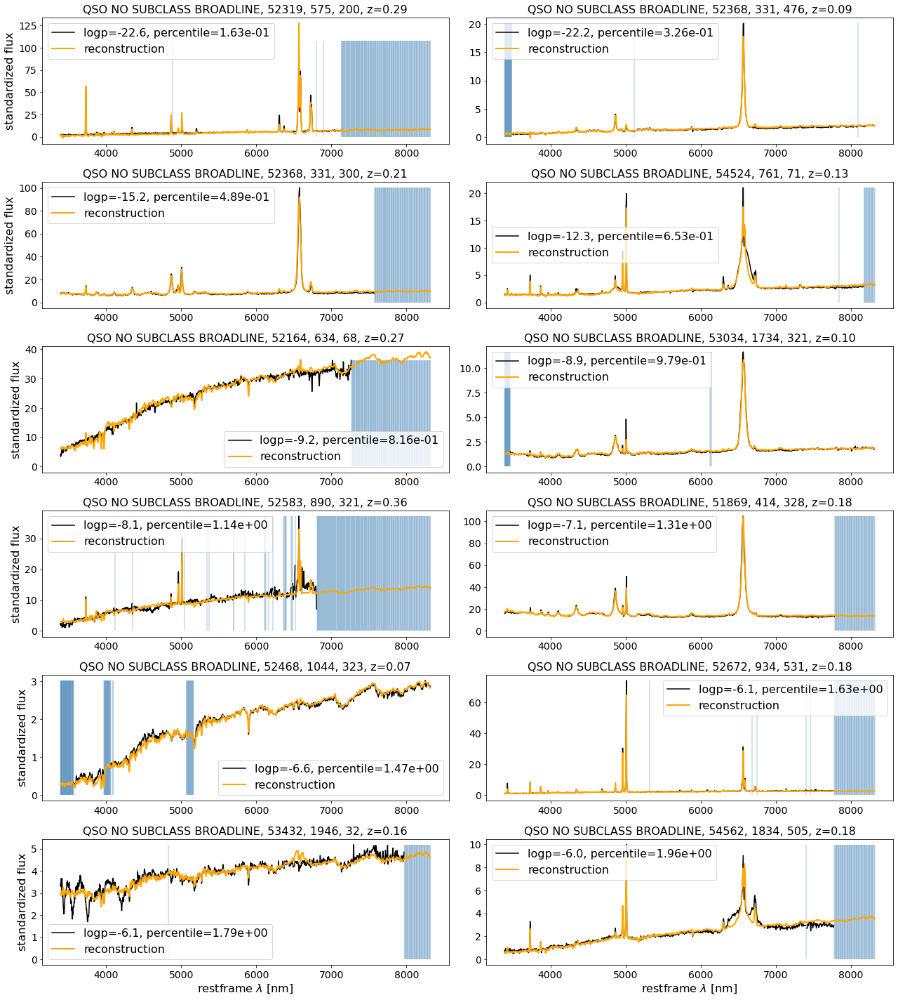

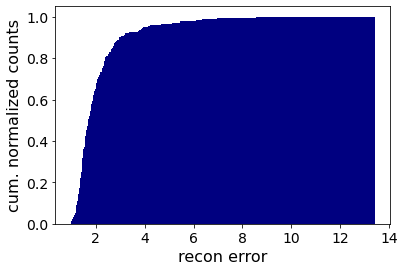

Anomalous Spectra test 10


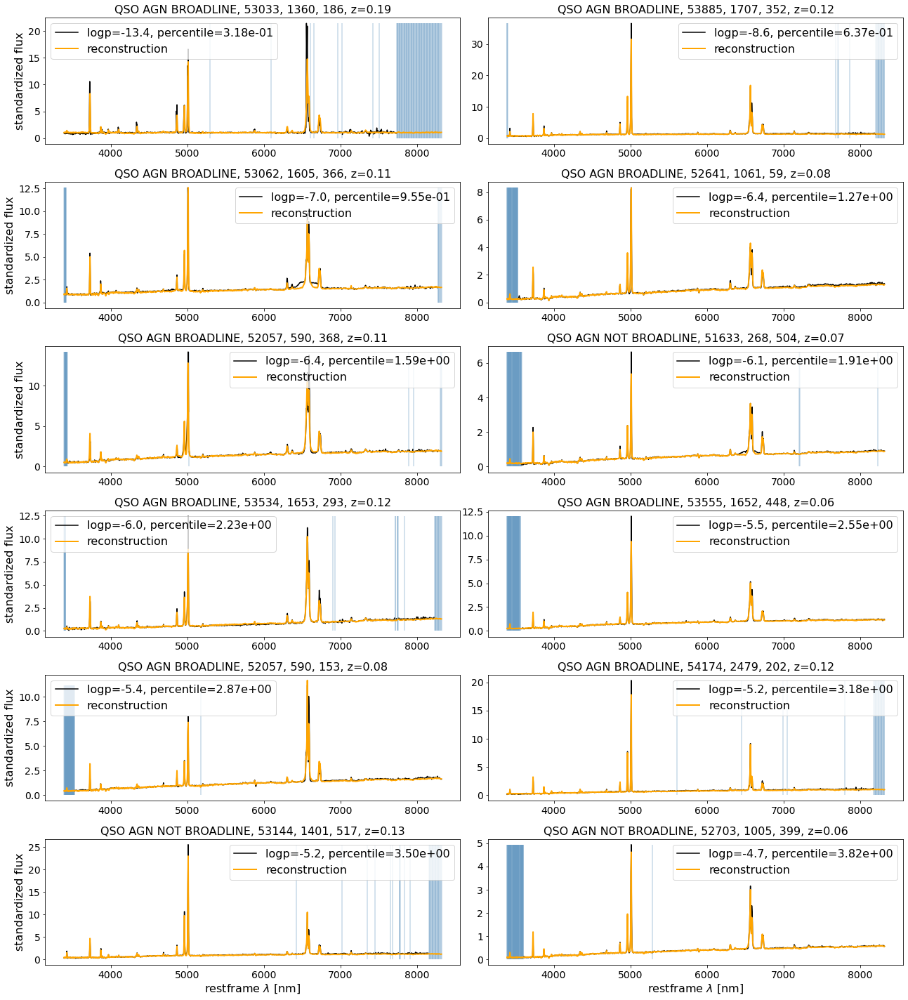

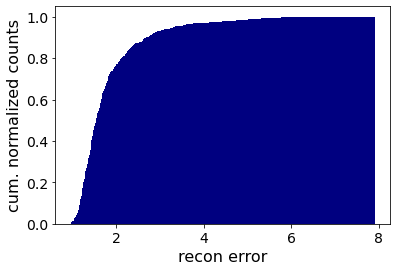

Anomalous Spectra test 12


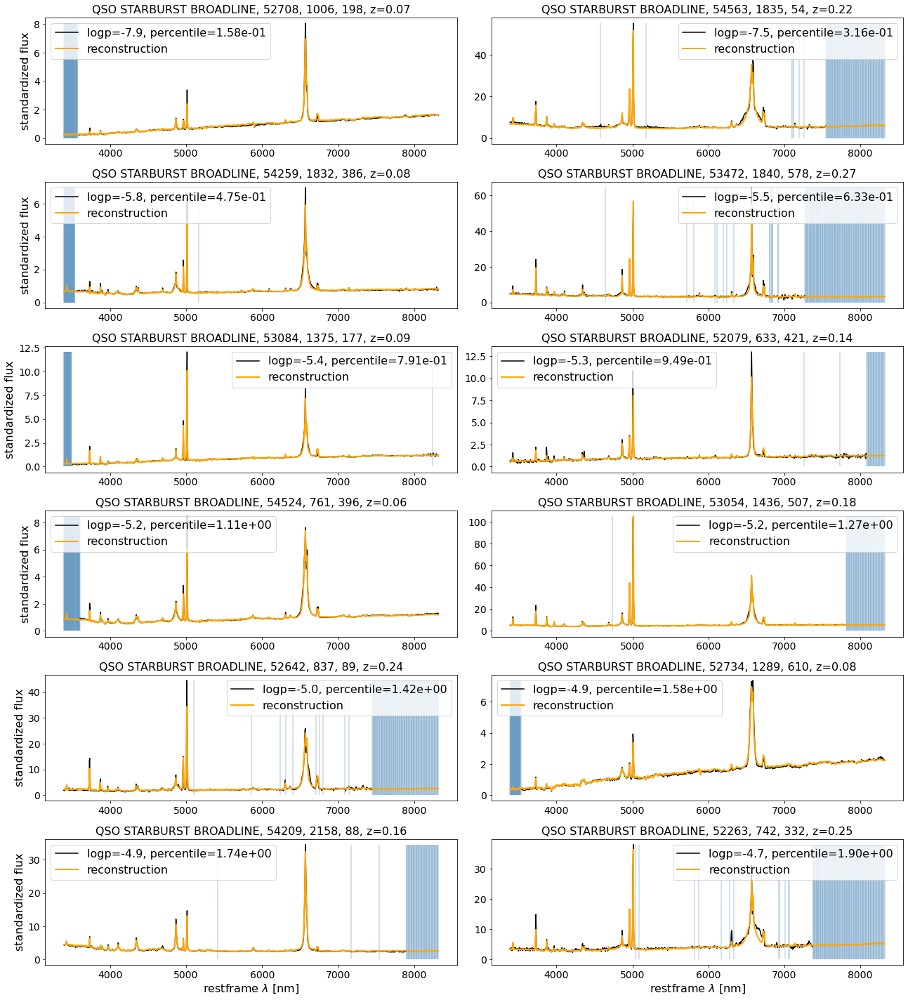

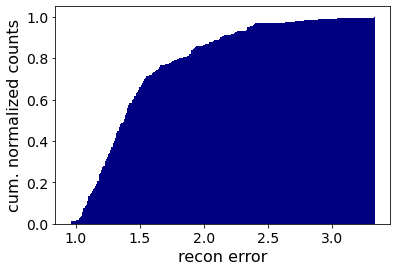

Anomalous Spectra test 14


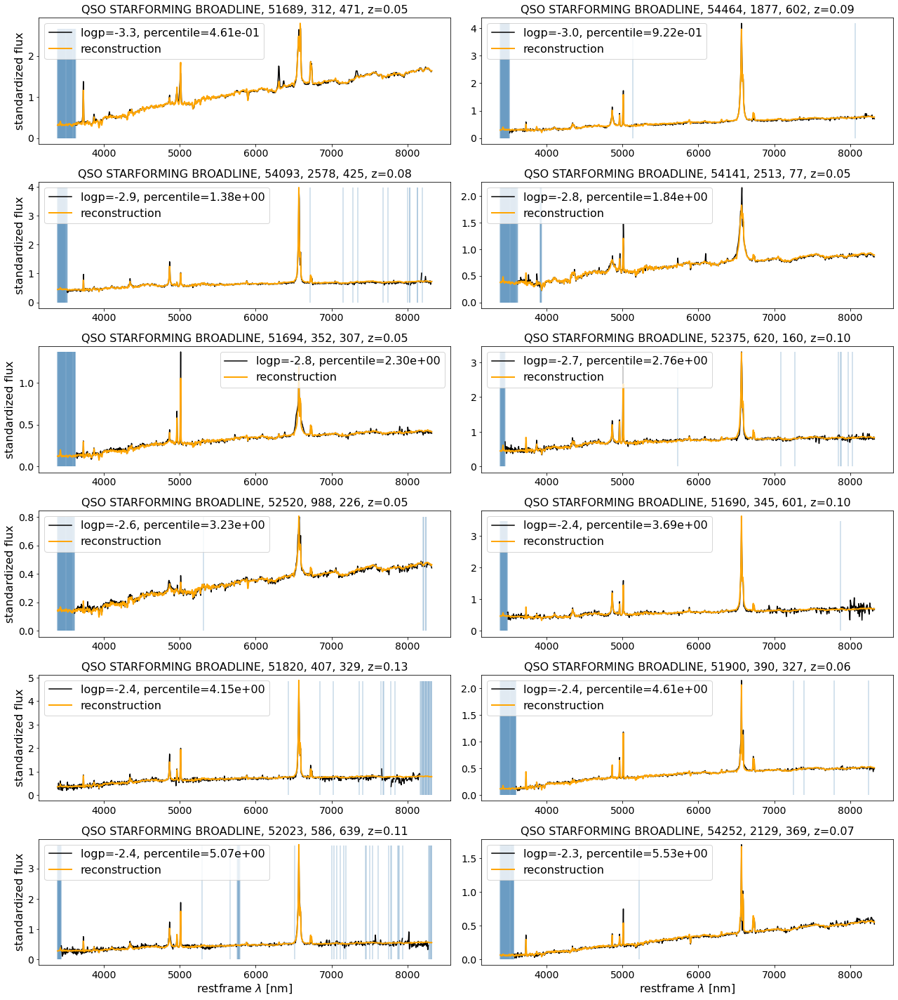

In [72]:
for mm in [0,  2,  4,  6,  8,  10,  12,  14]:
    for data, name, df in zip([test],['test'],[df_test]):
        ind               =np.where((df['new_label']==mm)|(df['new_label']==(mm+1)))[0]

        dens            = -df['recon_error'].iloc[ind].to_numpy()

        ind_ood         = np.argsort(dens)
        dens_sorted     = dens[ind_ood]

        cum, bins, _      = plt.hist(-dens_sorted,bins=500,density=True, cumulative=True, log=False, color='navy')
        plt.xlabel('recon error')
        plt.ylabel('cum. normalized counts')
        plt.savefig(os.path.join(plotpath,'original/recon_error/','recon_error_hist_%s_%sd.pdf'%(name,mm)), bbox_inches='tight')
        plt.show()
        plt.close()

        outliers_decoded  = decoded[name][ind][ind_ood]
        outliers_input    = masked[name][ind][ind_ood]

        wlmin, wlmax      = (3388,8318)
        fixed_num_bins    = 1000
        wl_range          = (np.log10(wlmin),np.log10(wlmax))
        new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

        print('Anomalous Spectra', name, mm)
        fi, ax = plt.subplots(6,2,figsize=(18,20))
        ax = ax.flatten()
        for ii in range(min(len(dens_sorted),12)):
            percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
            ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
            ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, percentile=%.2e'%(dens_sorted[ii],percentile), color='black')
            ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3)
            ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
            ax[ii].legend()
            if ii in [10,11]:
                ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
            if ii%2==0:
                ax[ii].set_ylabel(r'standardized flux')        
        plt.tight_layout()
        plt.savefig(os.path.join(plotpath,'original/recon_error/','recon_error_outliers_class_%s_class_%s.pdf'%(name,mm)), bbox_inches='tight')
        plt.show()
        plt.close()

        # print('Most normal Spectra', name, mm)
        # fi, ax = plt.subplots(6,2,figsize=(18,20),sharex=True)
        # ax = ax.flatten()
        # for nn, ii in enumerate(range(len(ind_ood)-min(len(dens_sorted),12),len(ind_ood))):
        #     percentile = scipy.stats.percentileofscore(dens_sorted, dens_sorted[ii], kind='rank')
        #     ax[nn].set_title('%s, %d, %d, %d, z=%.2f'%(classes[data['class'][ind][ind_ood][ii]], data['MJD'][ind][ind_ood][ii],data['plate'][ind][ind_ood][ii],data['fiber'][ind][ind_ood][ii],data['z'][ind][ind_ood][ii]))
        #     ax[nn].plot(new_wl[1:],outliers_input[ii],label='recon error=%.1f, percentile=%.2e'%(-dens_sorted[ii],percentile), color='black')
        #     ax[nn].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ind_ood][ii].astype(bool))], ymin=min(0,min(data['spec'][ind][ind_ood][ii])),ymax=max(data['spec'][ind][ind_ood][ii]), color='steelblue',alpha=0.3, label='mask')
        #     ax[nn].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        #     ax[nn].legend()
        #     if nn in [10,11]:
        #         ax[nn].set_xlabel(r'restframe $\lambda$ [nm]')
        #     if nn%2==0:
        #         ax[nn].set_ylabel(r'standardized flux')                
        # plt.tight_layout()
        # plt.savefig(os.path.join(plotpath,'original/recon_error/','recon_error_most_common_class_%s_%s.pdf'%(name,(le.inverse_transform([mm])[0]).decode('utf8'))), bbox_inches='tight')
        # #plt.show()
        # plt.close()

(-0.189823290282938, 0.0) (-0.18346129174114328, 0.0)


Text(0, 0.5, 'log(p)')

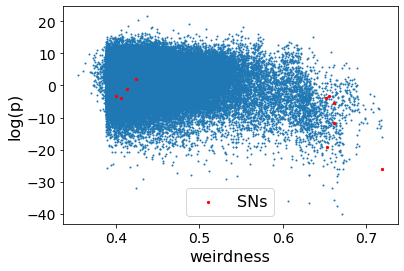

In [73]:
df_extern = pd.read_csv('../external_data/Baronetal_weirdness.csv')

df_train.rename(columns={'MJD':' mjd', 'fiber':' fiber'}, inplace=True)
df_valid.rename(columns={'MJD':' mjd', 'fiber':' fiber'}, inplace=True)
df_test.rename(columns={'MJD':' mjd', 'fiber':' fiber'}, inplace=True)
Supernovas.rename(columns={'MJD':' mjd', 'fiber':' fiber'}, inplace=True)


df_overlap_train = df_extern.merge(df_train,how='inner',on=['plate',' mjd',' fiber']).set_index('index').reset_index()
df_overlap_valid = df_extern.merge(df_valid,how='inner',on=['plate',' mjd',' fiber']).set_index('index').reset_index()
df_overlap_test  = df_extern.merge(df_test,how='inner',on=['plate',' mjd',' fiber']).set_index('index').reset_index()

df_overlap_ours  = pd.concat([df_overlap_test,df_overlap_valid,df_overlap_train])
df_overlap_ours  = df_overlap_ours[(df_overlap_ours['new_label']==1)|(df_overlap_ours['new_label']==0)]

df_overlap_sn    = df_extern.merge(Supernovas,how='inner',on=['plate',' mjd',' fiber'])

print(scipy.stats.pearsonr(df_overlap_ours['logp'],df_overlap_ours[' weirdness']), scipy.stats.pearsonr(df_overlap_ours['logp_marg_corr'],df_overlap_ours[' weirdness']))
plt.scatter(df_overlap_ours[' weirdness'][df_overlap_ours['logp_marg_corr']>-60],df_overlap_ours['logp_marg_corr'][df_overlap_ours['logp_marg_corr']>-60],s=1)
plt.scatter(df_overlap_ours[' weirdness'][df_overlap_ours['supernova']==1],df_overlap_ours['logp_marg_corr'][df_overlap_ours['supernova']==1],s=5, color='red', label='SNs')
plt.legend()
plt.xlabel('weirdness')
plt.ylabel('log(p)')

333
Anomalous Spectra test


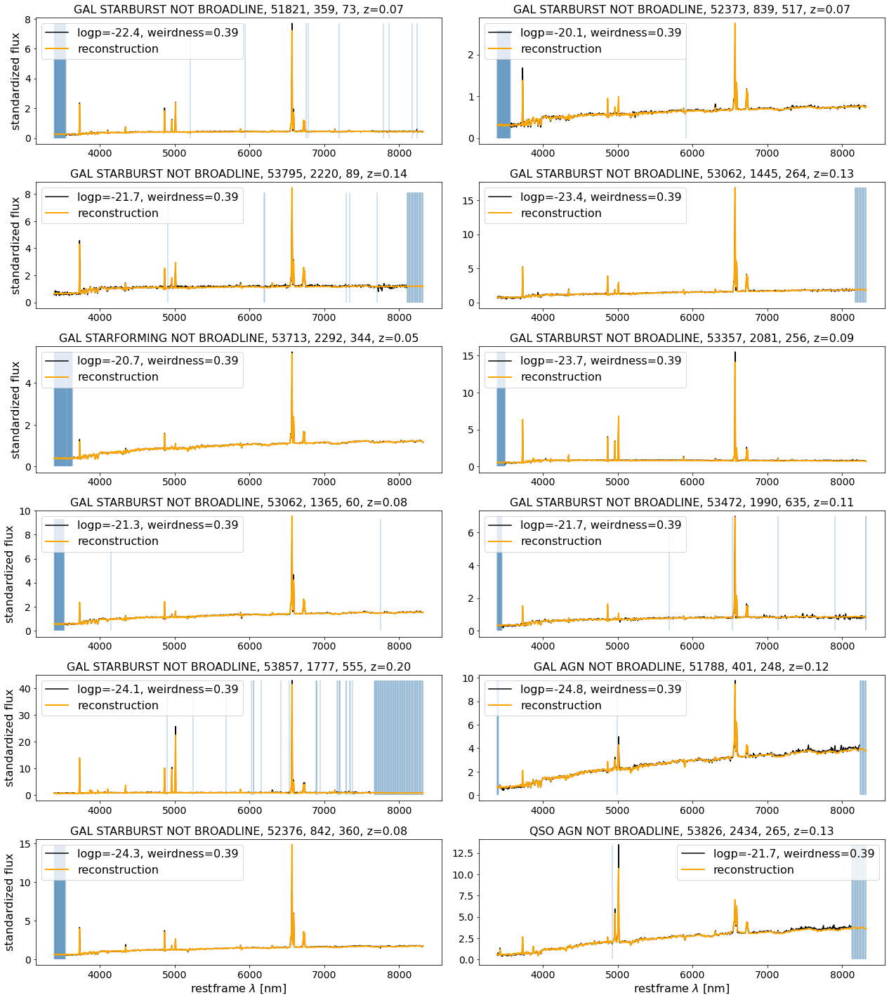

In [131]:
ind1 = df_overlap_test[(df_overlap_test['logp_marg_corr']<-20)&(df_overlap_test[' weirdness']<0.5)].sort_values([' weirdness'],ascending=True).index

df_overlap_test[(df_overlap_test['logp_marg_corr']<-20)&(df_overlap_test[' weirdness']<0.5)].sort_values([' weirdness'],ascending=True)

ind = df_overlap_test[(df_overlap_test['logp_marg_corr']<-20)&(df_overlap_test[' weirdness']>=0.5)].sort_values([' weirdness'],ascending=True)['index']

print(len(ind))
for data, name, df in zip([test],['test'],[df_test]):
    dens_sorted     = df['logp_marg_corr'].iloc[ind].to_numpy()
    outliers_encoded  = encoded_test[ind]
    outliers_decoded  = decoded[name][ind]
    outliers_input    = masked[name][ind]
    weirdness         = df_overlap_test[' weirdness'][ind1]
    wlmin, wlmax      = (3388,8318)
    fixed_num_bins    = 1000
    wl_range          = (np.log10(wlmin),np.log10(wlmax))
    new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

    print('Anomalous Spectra', name)
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax = ax.flatten()
    for ii in range(min(len(dens_sorted),12)):
        ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ii]], data['MJD'][ind][ii],data['plate'][ind][ii],data['fiber'][ind][ii],data['z'][ind][ii]))
        ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, weirdness=%.2f'%(dens_sorted[ii],weirdness.iloc[ii]), color='black')
        ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ii]), color='steelblue',alpha=0.3)
        ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        ax[ii].legend()
        if ii in [10,11]:
            ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
        if ii%2==0:
            ax[ii].set_ylabel(r'standardized flux')        
    plt.tight_layout()
    plt.savefig(os.path.join(plotpath,'original/logp/','low_weird_low_logp_%s.pdf'%(name)), bbox_inches='tight')
    plt.show()
    plt.close()

In [132]:
model = model.to(device)

for param in model.parameters():
    param.requires_grad = False

In [137]:
num_steps = 30  # how many optim steps to take
updates   = []
logps     = []

def logp(x,label):
    return -model.evaluate_density(x,label)

for nn in range(3,5):
    print(nn)
    model.requires_grad_(False)
    x     = torch.nn.Parameter(torch.Tensor(outliers_encoded[nn:nn+1]).to(device), requires_grad=True)
    label = torch.Tensor(df_test['new_label'].iloc[ind].to_numpy()).to(device)[nn:nn+1]
    optim = torch.optim.Adam([x], lr=1e-1)
    logp_ = logp(x,label)
    logps.append(logp_.cpu().detach().numpy())
    print(logp_,x,label)
    for jj in range(num_steps):
        print(jj)
        optim.zero_grad()
        updates.append(x.cpu().detach().numpy())
        logp_ = logp(x,label)
        logp_.backward()
        logps.append(logp_.cpu().detach().numpy())
        print(logp_)
        optim.step()

3
tensor([24.3638], device='cuda:0', grad_fn=<NegBackward>) Parameter containing:
tensor([[ -7.2425,  -2.7142,  -6.0582,  -3.0025, -11.8849, -27.5265,  -2.9658,
          18.7023,   1.9022,  10.3663]], device='cuda:0', requires_grad=True) tensor([4.], device='cuda:0')
0
tensor([24.3638], device='cuda:0', grad_fn=<NegBackward>)
1
tensor([23.5918], device='cuda:0', grad_fn=<NegBackward>)
2
tensor([24.3131], device='cuda:0', grad_fn=<NegBackward>)
3
tensor([23.5904], device='cuda:0', grad_fn=<NegBackward>)
4
tensor([22.9833], device='cuda:0', grad_fn=<NegBackward>)
5
tensor([22.9281], device='cuda:0', grad_fn=<NegBackward>)
6
tensor([22.8524], device='cuda:0', grad_fn=<NegBackward>)
7
tensor([22.7406], device='cuda:0', grad_fn=<NegBackward>)
8
tensor([22.5519], device='cuda:0', grad_fn=<NegBackward>)
9
tensor([22.2838], device='cuda:0', grad_fn=<NegBackward>)
10
tensor([22.0642], device='cuda:0', grad_fn=<NegBackward>)
11
tensor([21.9767], device='cuda:0', grad_fn=<NegBackward>)
12
tensor

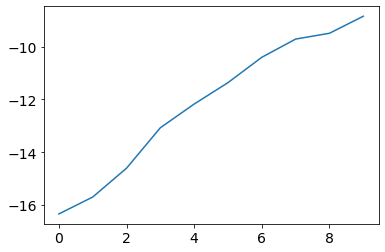

In [121]:
plt.plot(-np.asarray(logps))

In [138]:
np.save('optimization_results_long.npy',[updates,logps])

Anomalous Spectra test


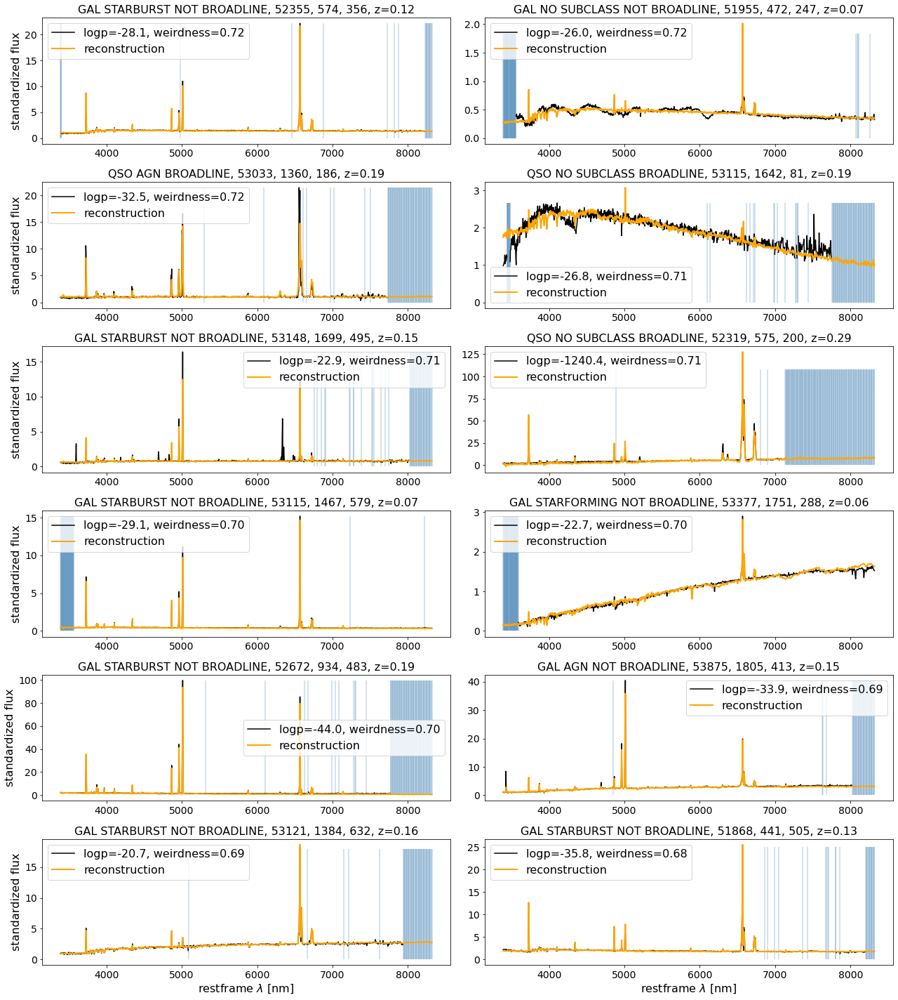

In [75]:
ind1 = df_overlap_test[(df_overlap_test['logp_marg_corr']<-20)&(df_overlap_test[' weirdness']>=0.68)].sort_values([' weirdness'],ascending=False).index

df_overlap_test[(df_overlap_test['logp_marg_corr']<-20)&(df_overlap_test[' weirdness']>=0.68)].sort_values([' weirdness'],ascending=False)

ind = df_overlap_test[(df_overlap_test['logp_marg_corr']<-20)&(df_overlap_test[' weirdness']>=0.68)].sort_values([' weirdness'],ascending=False)['index']


for data, name, df in zip([test],['test'],[df_test]):
    dens_sorted     = df['logp_marg_corr'].iloc[ind].to_numpy()

    outliers_decoded  = decoded[name][ind]
    outliers_input    = masked[name][ind]
    weirdness         = df_overlap_test[' weirdness'][ind1]
    wlmin, wlmax      = (3388,8318)
    fixed_num_bins    = 1000
    wl_range          = (np.log10(wlmin),np.log10(wlmax))
    new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

    print('Anomalous Spectra', name)
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax = ax.flatten()
    for ii in range(min(len(dens_sorted),12)):
        ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ii]], data['MJD'][ind][ii],data['plate'][ind][ii],data['fiber'][ind][ii],data['z'][ind][ii]))
        ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, weirdness=%.2f'%(dens_sorted[ii],weirdness.iloc[ii]), color='black')
        ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ii]), color='steelblue',alpha=0.3)
        ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        ax[ii].legend()
        if ii in [10,11]:
            ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
        if ii%2==0:
            ax[ii].set_ylabel(r'standardized flux')        
    plt.tight_layout()
    plt.savefig(os.path.join(plotpath,'original/logp/','high_weird_low_logp_%s.pdf'%(name)), bbox_inches='tight')
    plt.show()
    plt.close()

663
Anomalous Spectra test


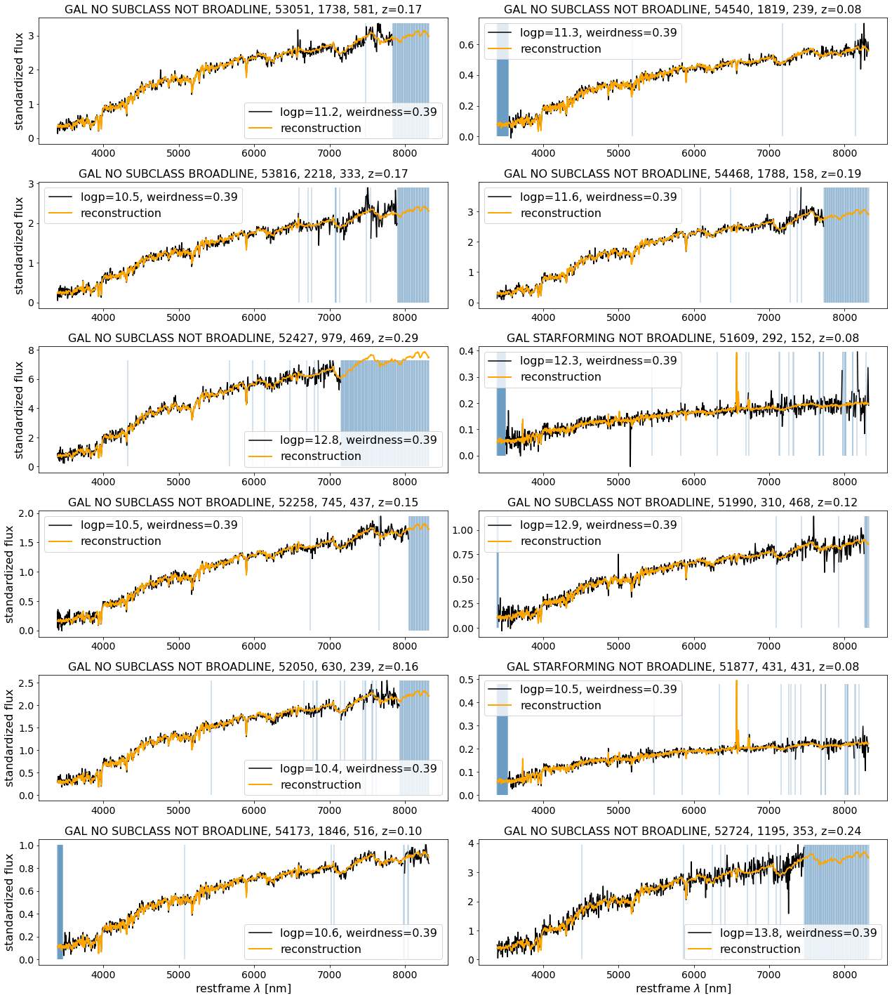

In [76]:
ind1 = df_overlap_test[(df_overlap_test['logp_marg_corr']>10)&(df_overlap_test[' weirdness']<0.4)].sort_values([' weirdness'],ascending=True).index

df_overlap_test[(df_overlap_test['logp_marg_corr']>10)&(df_overlap_test[' weirdness']<0.4)].sort_values([' weirdness'],ascending=True)

ind = df_overlap_test[(df_overlap_test['logp_marg_corr']>10)&(df_overlap_test[' weirdness']>=0.4)].sort_values([' weirdness'],ascending=True)['index']

print(len(ind))
for data, name, df in zip([test],['test'],[df_test]):
    dens_sorted     = df['logp_marg_corr'].iloc[ind].to_numpy()

    outliers_decoded  = decoded[name][ind]
    outliers_input    = masked[name][ind]
    weirdness         = df_overlap_test[' weirdness'][ind1]
    wlmin, wlmax      = (3388,8318)
    fixed_num_bins    = 1000
    wl_range          = (np.log10(wlmin),np.log10(wlmax))
    new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

    print('Anomalous Spectra', name)
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax = ax.flatten()
    for ii in range(min(len(dens_sorted),12)):
        ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ii]], data['MJD'][ind][ii],data['plate'][ind][ii],data['fiber'][ind][ii],data['z'][ind][ii]))
        ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, weirdness=%.2f'%(dens_sorted[ii],weirdness.iloc[ii]), color='black')
        ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ii]), color='steelblue',alpha=0.3)
        ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        ax[ii].legend()
        if ii in [10,11]:
            ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
        if ii%2==0:
            ax[ii].set_ylabel(r'standardized flux')        
    plt.tight_layout()
    plt.savefig(os.path.join(plotpath,'original/logp/','low_weird_high_logp_%s.pdf'%(name)), bbox_inches='tight')
    plt.show()
    plt.close()

Anomalous Spectra test


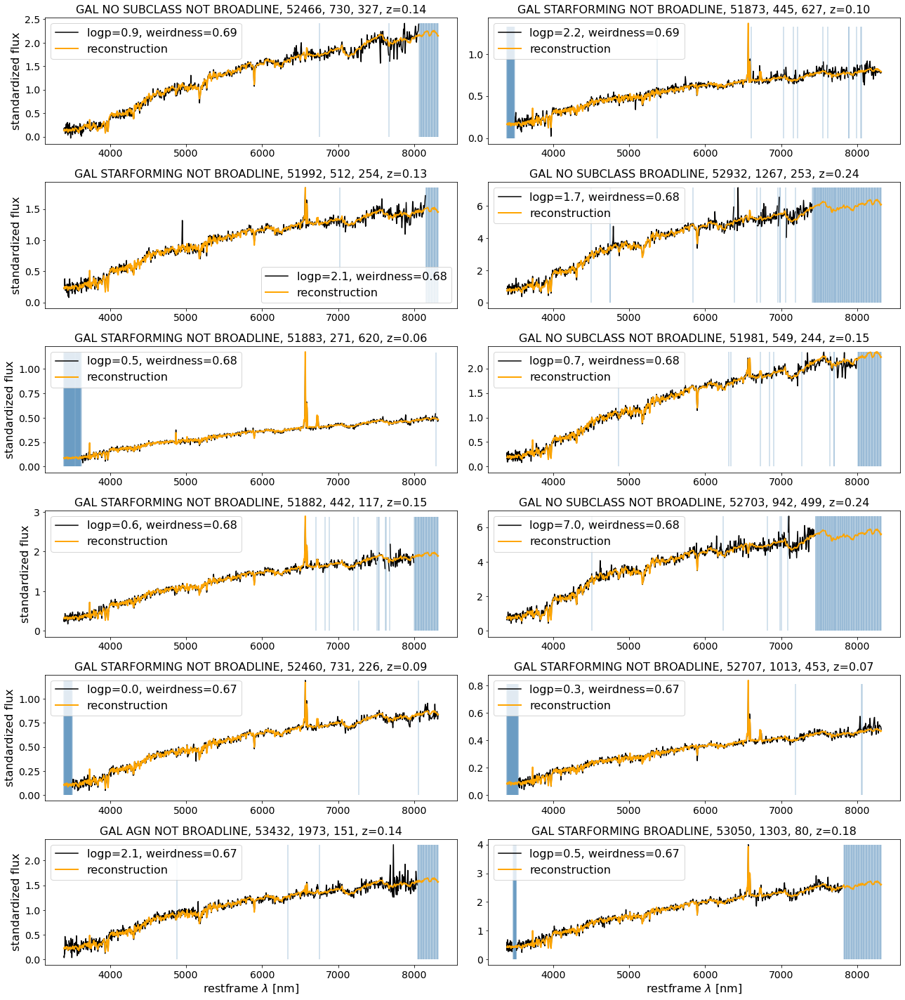

In [77]:
ind1 = df_overlap_test[(df_overlap_test['logp_marg_corr']>0)&(df_overlap_test[' weirdness']>=0.65)].sort_values([' weirdness'],ascending=False).index

df_overlap_test[(df_overlap_test['logp_marg_corr']>0)&(df_overlap_test[' weirdness']>=0.65)].sort_values([' weirdness'],ascending=False)

ind = df_overlap_test[(df_overlap_test['logp_marg_corr']>0)&(df_overlap_test[' weirdness']>=0.65)].sort_values([' weirdness'],ascending=False)['index']


for data, name, df in zip([test],['test'],[df_test]):
    dens_sorted     = df['logp_marg_corr'].iloc[ind].to_numpy()

    outliers_decoded  = decoded[name][ind]
    outliers_input    = masked[name][ind]
    weirdness         = df_overlap_test[' weirdness'][ind1]
    wlmin, wlmax      = (3388,8318)
    fixed_num_bins    = 1000
    wl_range          = (np.log10(wlmin),np.log10(wlmax))
    new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

    print('Anomalous Spectra', name)
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax = ax.flatten()
    for ii in range(min(len(dens_sorted),12)):
        ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ii]], data['MJD'][ind][ii],data['plate'][ind][ii],data['fiber'][ind][ii],data['z'][ind][ii]))
        ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, weirdness=%.2f'%(dens_sorted[ii],weirdness.iloc[ii]), color='black')
        ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ii]), color='steelblue',alpha=0.3)
        ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        ax[ii].legend()
        if ii in [10,11]:
            ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
        if ii%2==0:
            ax[ii].set_ylabel(r'standardized flux')        
    plt.tight_layout()
    plt.savefig(os.path.join(plotpath,'original/logp/','high_weird_high_logp_%s.pdf'%(name)), bbox_inches='tight')
    plt.show()
    plt.close()

In [ ]:
Supernovae =[[454,51908,559],[412,51931,205],[543,52017,2],[438,51884,462],[549,51981,379],[472,51955,247],[452,51911,319],[556,51991,317],[480,51989,24],\
[268,51633,572],[271,51883,171],[275,51910,104],[291,51928,76],[604,52079,209],[498,51984,102],[305,51613,575],[622,52054,11],[358,51818,181]]


Supernovae = pd.DataFrame(Supernovae).rename(columns={0:'plate',1:' mjd',2:' fiber'})

In [ ]:
Supernovae.to_pickle(path='./Supernova_Sample.pkl')

(-50.0, 30.0)

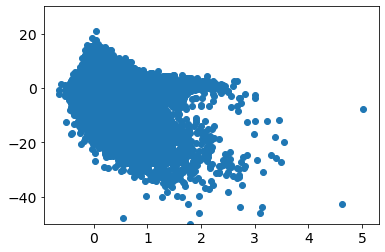

In [310]:
plt.scatter(np.log(df_test['recon_error']),df_test['logp_marg_corr'])
plt.ylim(-50,30)

Anomalous Spectra test


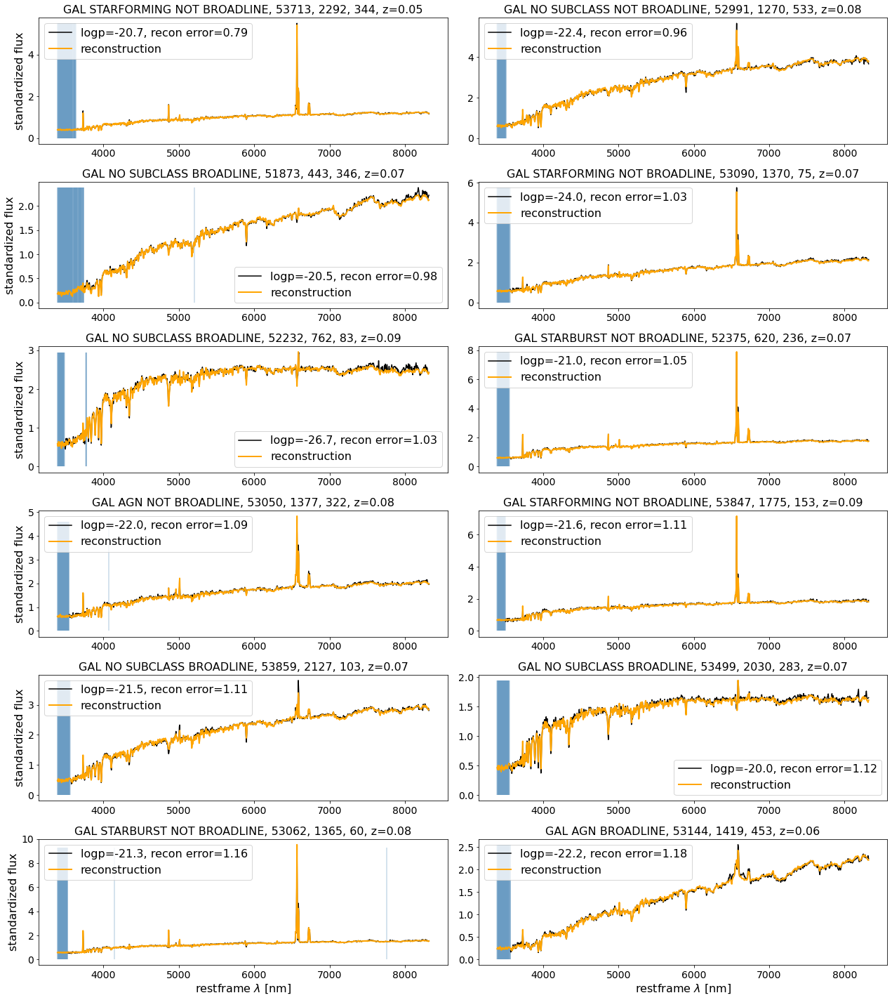

In [78]:
ind =df_test[(df_test['logp_marg_corr']<-20)&(np.log(df_test['recon_error'])<0.2)].sort_values(['recon_error'],ascending=True).index


df_test[(df_test['logp_marg_corr']<-20)&(np.log(df_test['recon_error'])<0.2)].sort_values(['recon_error'],ascending=True)

for data, name, df in zip([test],['test'],[df_test]):
    dens_sorted     = df['logp_marg_corr'].iloc[ind].to_numpy()

    outliers_decoded  = decoded[name][ind]
    outliers_input    = masked[name][ind]
    weirdness         = df['recon_error'][ind]
    wlmin, wlmax      = (3388,8318)
    fixed_num_bins    = 1000
    wl_range          = (np.log10(wlmin),np.log10(wlmax))
    new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

    print('Anomalous Spectra', name)
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax = ax.flatten()
    for ii in range(min(len(dens_sorted),12)):
        ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ii]], data['MJD'][ind][ii],data['plate'][ind][ii],data['fiber'][ind][ii],data['z'][ind][ii]))
        ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, recon error=%.2f'%(dens_sorted[ii],weirdness.iloc[ii]), color='black')
        ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ii]), color='steelblue',alpha=0.3)
        ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        ax[ii].legend()
        if ii in [10,11]:
            ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
        if ii%2==0:
            ax[ii].set_ylabel(r'standardized flux')        
    plt.tight_layout()
    plt.savefig(os.path.join(plotpath,'original/recon_error/','low_recon_error_low_logp_%s.pdf'%(name)), bbox_inches='tight')
    plt.show()
    plt.close()

       index    mjd   fiber  plate  new_label          RA  logp_marg  \
63069  63069  51994     530    533          0  213.851746 -11.622638   
50453  50453  54154     520   2497          0  171.319763  -5.580242   
413      413  53799     132   1703          0  210.784363   1.545287   
7825    7825  53061      71   1378          0  210.226685 -14.373345   
5638    5638  51811     494    416          0   55.312714 -11.857888   
26529  26529  54524     259   2294          0  142.563507 -10.218671   
27988  27988  53055     258   1606          0  171.630020  -3.239406   
23536  23536  53386     262   1941          0  141.285736   0.803111   
30055  30055  52138     229    652          0    3.714459   0.499358   
58212  58212  53818     112   2228          6  182.679245  -9.341287   
63103  63103  53851     474   2480          6  161.286057   6.891170   
34587  34587  53054     209   1743          6  147.862839  -7.484872   
92        92  53430     169   1974          0  173.140854 -12.09

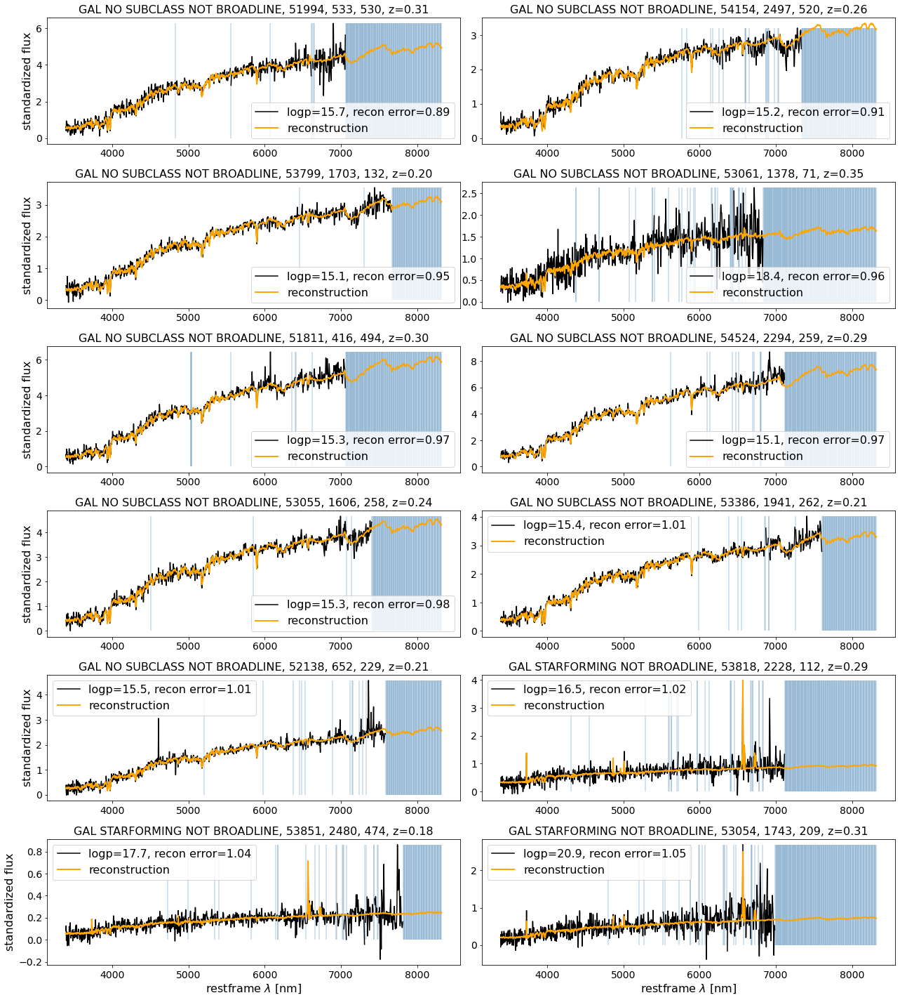

In [79]:
ind =df_test[(df_test['logp_marg_corr']>15)&(np.log(df_test['recon_error'])<0.2)].sort_values(['recon_error'],ascending=True).index


print(df_test[(df_test['logp_marg_corr']>15)&(np.log(df_test['recon_error'])<0.2)].sort_values(['recon_error'],ascending=True))


for data, name, df in zip([test],['test'],[df_test]):
    dens_sorted     = df['logp_marg_corr'].iloc[ind].to_numpy()

    outliers_decoded  = decoded[name][ind]
    outliers_input    = masked[name][ind]
    weirdness         = df['recon_error'][ind]
    wlmin, wlmax      = (3388,8318)
    fixed_num_bins    = 1000
    wl_range          = (np.log10(wlmin),np.log10(wlmax))
    new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

    print('Anomalous Spectra', name)
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax = ax.flatten()
    for ii in range(min(len(dens_sorted),12)):
        ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ii]], data['MJD'][ind][ii],data['plate'][ind][ii],data['fiber'][ind][ii],data['z'][ind][ii]))
        ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, recon error=%.2f'%(dens_sorted[ii],weirdness.iloc[ii]), color='black')
        ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ii]), color='steelblue',alpha=0.3)
        ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        ax[ii].legend()
        if ii in [10,11]:
            ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
        if ii%2==0:
            ax[ii].set_ylabel(r'standardized flux')        
    plt.tight_layout()
    plt.savefig(os.path.join(plotpath,'original/recon_error/','low_recon_error_high_logp_%s.pdf'%(name)), bbox_inches='tight')
    plt.show()
    plt.close()

       index    mjd   fiber  plate  new_label          RA  logp_marg  \
33398  33398  53050     210   1362          6  163.117722   9.053254   
49644  49644  54152     555   1803          6  206.635803   9.002650   
50787  50787  54156     584   1801          6  204.718430   7.294993   
22149  22149  53889     164   2167          6  235.482574   7.039087   
26339  26339  52145     492    663          6   24.802971   7.392811   
13573  13573  53377     483   1751          6  166.705521   7.836016   
61784  61784  54270     255   1792          6  193.057327   6.651442   
43375  43375  51929     417    470          6  135.801483   7.059958   
67735  67735  53727     413   2290          6  140.006119   7.397000   
61407  61407  51955     355    472          6  137.472076   7.237817   
43114  43114  53770     578   2352          6  159.446487   7.963135   
29066  29066  53852     442   2483          6  163.423767   8.331556   
39324  39324  52583     166    890          6  117.954819   6.56

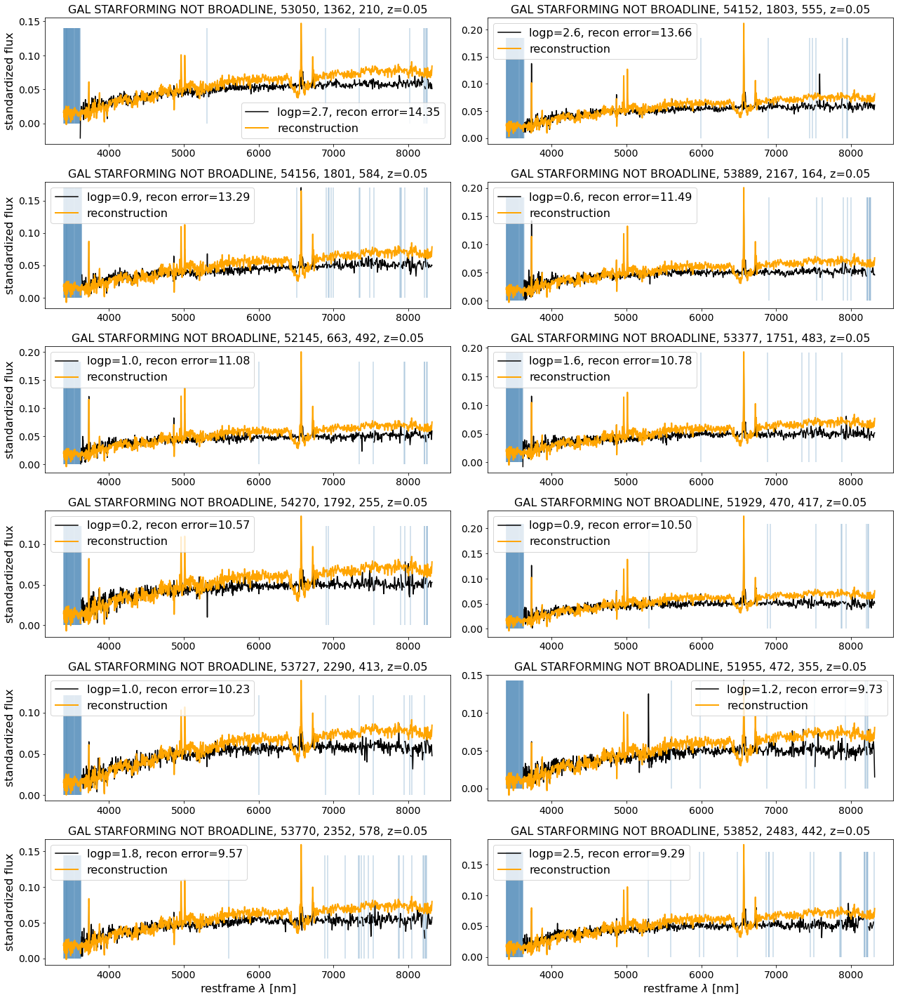

In [85]:
ind =df_test[(df_test['logp_marg_corr']>0)&(np.log(df_test['recon_error'])>2)].sort_values(['recon_error'],ascending=False).index


print(df_test[(df_test['logp_marg_corr']>0)&(np.log(df_test['recon_error'])>2)].sort_values(['recon_error'],ascending=False))


for data, name, df in zip([test],['test'],[df_test]):
    dens_sorted     = df['logp_marg_corr'].iloc[ind].to_numpy()

    outliers_decoded  = decoded[name][ind]
    outliers_input    = masked[name][ind]
    weirdness         = df['recon_error'][ind]
    wlmin, wlmax      = (3388,8318)
    fixed_num_bins    = 1000
    wl_range          = (np.log10(wlmin),np.log10(wlmax))
    new_wl            = np.logspace(wl_range[0],wl_range[1],fixed_num_bins+1)

    print('Anomalous Spectra', name)
    fi, ax = plt.subplots(6,2,figsize=(18,20))
    ax = ax.flatten()
    for ii in range(min(len(dens_sorted),12)):
        ax[ii].set_title('%s, %d, %d, %d, z=%.2f'%(le[data['new_label'][ind][ii]], data['MJD'][ind][ii],data['plate'][ind][ii],data['fiber'][ind][ii],data['z'][ind][ii]))
        ax[ii].plot(new_wl[1:],outliers_input[ii],label='logp=%.1f, recon error=%.2f'%(dens_sorted[ii],weirdness.iloc[ii]), color='black')
        ax[ii].vlines( x=new_wl[1:][np.squeeze(~data['mask'][ind][ii].astype(bool))], ymin=0,ymax=max(data['spec'][ind][ii]), color='steelblue',alpha=0.3)
        ax[ii].plot(new_wl[1:],outliers_decoded[ii], label='reconstruction',ls='-', color='orange', lw=2)
        ax[ii].legend()
        if ii in [10,11]:
            ax[ii].set_xlabel(r'restframe $\lambda$ [nm]')
        if ii%2==0:
            ax[ii].set_ylabel(r'standardized flux')        
    plt.tight_layout()
    plt.savefig(os.path.join(plotpath,'original/recon_error/','high_recon_error_high_logp_%s.pdf'%(name)), bbox_inches='tight')
    plt.show()
    plt.close()